In [1]:
import scvelo as scv
import dynamo as dyn
import numpy as np
from anndata import AnnData
# import loompy
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import fcluster,leaders
from sklearn.decomposition import PCA
from scipy.linalg import inv
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal
from scipy.sparse import csr_matrix,issparse
import pandas as pd
import seaborn as sns

In [2]:
import argparse
import random

import scipy.sparse as sp
import scipy.sparse.csgraph
import sklearn.linear_model as sklm
import sklearn.metrics as skm
import sklearn.model_selection as skms
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
#from ignite.engine import Engine, Events
#from ignite.handlers import ModelCheckpoint
from torch.utils.data import DataLoader, IterableDataset, get_worker_info

CHECKPOINT_PREFIX = "g2g"

from utils import *
# from minepy import MINE
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import gaussian_kde

In [3]:
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.current_device())

2.4.0
11.8
True
1
0


In [4]:
method = ''
from g2g_model_Fisher import *

In [5]:
data_path = 'data/'
# data_name = 'DG_bin'
# data_name = 'DG_new'
# data_name = 'A549_emt_bin'
data_name = 'EG_ab_nhg'
#data_name = 'HB_sel_nhg1'
# data_name = 'neural_bin'
# adata0 = scv.read(data_path+data_name+'.h5ad', cache=True)
adata0 = scv.read(data_path+data_name+'.h5ad', cache=True)

# [k_nei, K] = [10, 4]
# L = np.load('results/'+data_name+','+method+'/'+str([k_nei,K])+',latent_dim.npy')
[k_nei, K, L] = [10, 2, 10]
# metric = 'minkowski'
metric = 'euclidean'
# metric = 'cosine'
# metric = 'correlation'
norm = 'none'
# norm = 'standard'
# norm = 'minmax'

result_path = 'results/'+data_name+','+norm+','+metric+','+method+','+str([k_nei,K,L])+'/'
figure_path = 'figures/'
cmap = plt.colormaps['Spectral']

In [6]:
import os

folder = os.path.exists(result_path)
if not folder:                   #判断是否存在文件夹如果不存在则创建为文件夹
    os.makedirs(result_path)            #makedirs 创建文件时如果路径不存在会创建这个路径

folder = os.path.exists(figure_path)
if not folder:
    os.makedirs(figure_path)

In [7]:
#-------data preprocessing
adata=adata0.copy()

scv.pp.neighbors(adata, n_neighbors=k_nei)
scv.pp.moments(adata, n_pcs=50, n_neighbors=k_nei)
scv.pp.pca(adata,n_comps=50)

computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [8]:
gene_arr = adata.var.index.values
X_pca = adata.obsm['X_pca']
X_umap = adata.obsm['X_umap']
#X_tsne = adata.obsm['X_tsne']
cell_vpt = adata.obs['palantir_pseudotime']
#cell_vpt = adata.obs['latent_time']
ppt_ind = np.argsort(cell_vpt)

Xs = adata.layers['Ms']#adata.X.A#
X = Xs
A = kneighbors_graph(X_pca, k_nei, mode='connectivity', include_self=True)
#A = kneighbors_graph(Xs, k_nei, mode='connectivity', include_self=True)

In [9]:
row = np.array([np.ones((k_nei,))*i for i in range(adata.shape[0])]).flatten()
col = A.indices
#col = adata.uns['neighbors']['indices'].flatten()
w_val = np.array([np.linalg.norm(X_pca[int(i),:]-X_pca[int(j),:]) for i,j in zip(row,col)])
adj_val = np.ones(col.shape)
A_mat = csr_matrix((adj_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))
W_mat = csr_matrix((w_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

In [10]:
dc = np.mean(w_val)

cell_nei = adata.uns['neighbors']['indices']
nei_w = []
rho_arr = []
for ni in adata.uns['neighbors']['indices']:
    dij=np.array([np.linalg.norm(X_pca[int(ni[0]),:]-X_pca[int(i),:]) for i in ni[1:]])
    
    rho=np.sum(np.exp(-dij**2/dc**2))
#     rho=np.exp(np.sum(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
#     print(dij)
#     print(np.exp(-dij**2/dc**2)/np.sum(np.exp(-dij**2/dc**2)))
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)
nei_w=np.hstack((np.ones((nei_w.shape[0],1)),nei_w))/2

def smooth_func(X_val,cell_nei=cell_nei,nei_w=nei_w):
    X_s=X_val.copy()
    for ci in range(len(X_val)):
        X_s[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return X_s

In [11]:
epochs = 200
nsamples = 5
learning_rate = 1e-3
seed = 0
# n_workers = 4

if seed is not None:
    reset_seeds(seed)

A = A_mat
A = A.astype(np.float32)
X = X.astype(np.float32)
z = np.zeros(adata.n_obs)

n = A.shape[0]
train_nodes, val_nodes = train_test_split(n, train_ratio=1.0)
A_train = A[train_nodes, :][:, train_nodes]
X_train = X[train_nodes]
z_train = z[train_nodes]
A_val = A[val_nodes, :][:, val_nodes]
X_val = X[val_nodes]
z_val = z[val_nodes]

train_data = AttributedGraph(A_train, X_train, z_train, K)
val_data = AttributedGraph(A_val, X_val, z_val, K)

encoder = torch.load(result_path+'encoder.pt')

In [12]:
mu, sigma = encoder(torch.tensor(X))
mu_learned = mu.detach().numpy()
sigma_learned = sigma.detach().numpy()

Fisher_g=np.zeros((X.shape[0],L*2,L*2))
for i in range(X.shape[0]):
    for j in range(L):
        Fisher_g[i,j,j]=1/sigma_learned[i,j]**2
        Fisher_g[i,L+j,L+j]=2/sigma_learned[i,j]**2

Fisher_g_diag = np.zeros([X.shape[0],L*2])
for i in range(X.shape[0]):
    Fisher_g_diag[i] = np.diag(Fisher_g[i])

In [13]:
X_plt = X_umap[:,0]
Y_plt = X_umap[:,1]

In [14]:
cl = 'clusters'
    
cl_name = np.unique(adata.obs[cl])
palette = sns.color_palette("RdBu_r",n_colors=cl_name.shape[0])
# palette = sns.color_palette(n_colors=cl_name.shape[0])
cln = np.array(adata.obs[cl])
cl_vpt = np.zeros(cl_name.shape[0])
for i in range(cl_name.shape[0]):
    if data_name=='DG_bin':
        cl_vpt[i] = np.mean(cell_vpt[cln==cl_name[i]])
    else:
        cl_vpt[i] = np.mean(cell_vpt[cln==cl_name[i]])
cl_vpt_ind = np.argsort(cl_vpt)
cl_name_vpt = cl_name[cl_vpt_ind]

cln_vpt_ind = np.zeros(cln.shape[0],dtype=int)
clx = np.zeros(cln.shape[0])
clc = np.array([palette[0]]*cln.shape[0])
cl_ind = np.zeros(cl_name.shape[0])
i_ind = 0
for i in range(cl_name.shape[0]):
    cli_ind = np.argwhere(cln==cl_name_vpt[i])[:,0]
    ni = cli_ind.shape[0]
    cln_vpt_ind[i_ind:i_ind+ni] = cli_ind
    clx[cli_ind] = i
    clc[cli_ind] = palette[i]
    cl_ind[i] = i_ind+ni/2
    i_ind += ni
cln_vpt = cln[cln_vpt_ind]

In [16]:
#velo0 = np.array(adata.layers['velocity'])
#velo_g = np.zeros(velo0.shape)
#velo_g[:,adata.var['velocity_genes']] = velo0[:,adata.var['velocity_genes']]
#velo_pca = velo_g@adata.varm['PCs']
velo_pca = adata.obsm['velocity_pca']
latent_z = np.hstack((mu_learned,sigma_learned))

In [17]:
#------use a simple neural network to study dmu/dt and dsigma/dt
pca_dim = 50
from torch.optim import SGD
reset_seeds(0)

model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = SGD(model.parameters(), lr=0.01, weight_decay=0.001)#, momentum=0.2

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

pZ_pX = np.zeros([X.shape[0], L*2, X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_pX[i,j,:] = x0.grad.detach()

Z_velo = np.array([pZ_pX[i]@velo_pca[i] for i in range(X.shape[0])])

In [18]:
zv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    for j in range(L):
        # zv2[i] += Fisher_g[i,2*j,2*j]*Z_velo[i,2*j]**2 + Fisher_g[i,2*j+1,2*j+1]*Z_velo[i,2*j+1]**2
        zv2[i] += Fisher_g[i,j,j]*Z_velo[i,j]**2 + Fisher_g[i,L+j,L+j]*Z_velo[i,L+j]**2
zv1 = np.sqrt(zv2)

In [19]:
import seaborn as sns

palette1 = sns.color_palette('bright')
palette2 = sns.color_palette('pastel')
c1 = tuple((np.array(palette1[0])+np.array(palette1[-1]))/2)
c2 = tuple((np.array(palette2[0])+np.array(palette2[-1]))/2)

In [20]:
crc_eu = np.load(result_path+'crc_eu.npy')
crc_smooth = np.load(result_path+'crc_smooth.npy')

In [21]:
g_pc = np.zeros([X.shape[0],pca_dim,pca_dim])
for i in range(X.shape[0]):
    g_pc[i] = pZ_pX[i].T @ Fisher_g[i] @ pZ_pX[i]

gene_gij = np.zeros([X.shape[0],X.shape[1]])
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        gene_gij[i,j] = adata.varm['PCs'][j]@g_pc[i]@adata.varm['PCs'][j]

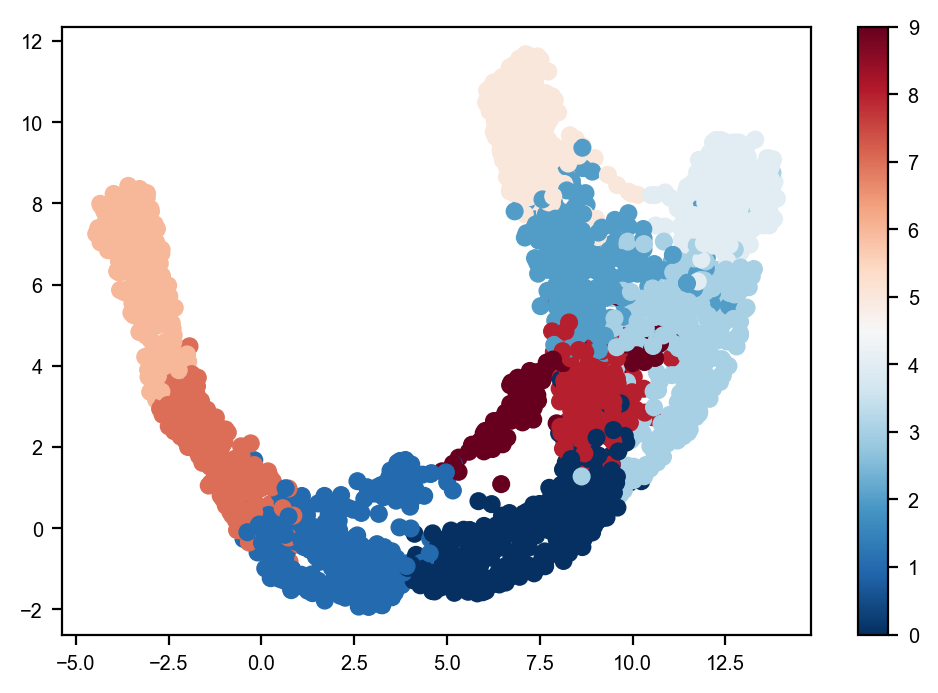

In [22]:
import scanpy as sc

sc.tl.louvain(adata, resolution=1.0)

cell_cl_label = np.array([int(adata.obs['louvain'][i]) for i in range(Xs.shape[0])])

plt.scatter(X_plt,Y_plt,c=cell_cl_label)
plt.colorbar()

In [57]:
def align(vecs,n_step=10):
    wij = vecs@vecs.T
    for i in range(vecs.shape[0]):
        wij[i,i] = 0
    mji = np.ones([vecs.shape[0],vecs.shape[0]])
    for i in range(vecs.shape[0]):
        mji[i,i] = 0
    beta = 1
    
    for k in range(n_step):
        for j in range(vecs.shape[0]):
            for i in range(vecs.shape[0]):
                if j==i:
                    mji[j,i] = 0
                else:
                    mji[j,i] = np.tanh(beta*(wij[j,:]@mji[:,j]-wij[j,i]*mji[i,j]))
        
    mi = np.zeros(vecs.shape[0])
    for i in range(vecs.shape[0]):
        mi[i] = np.tanh(beta*wij[i,:]@mji[:,i])
    si = np.array([np.sign(mi[i]) for i in range(vecs.shape[0])])
    
    vecs_a = np.array([si[i]*vecs[i] for i in range(vecs.shape[0])])
    return(vecs_a)

In [54]:
##cluster 均值
#clusters = adata.obs['Celltype']
#categories = ['Differentiating GABA interneurons', 'GABA interneurons', 'Gliogenic progenitors', 'Neural stem cells', 'Proliferating VZ progenitors', 'VZ progenitors']
clusters = cell_cl_label
categories = np.unique(clusters)

eigenvec = {}
cl_vpt = np.zeros(len(categories))

for i in categories:
    cl_ind = (clusters==i)
    g_pc_cl = g_pc[cl_ind]
    velo_cl = velo_pca[cl_ind]
    eigenvec[i] = np.zeros([g_pc_cl.shape[0],X_pca.shape[1]])

    for j in range(g_pc_cl.shape[0]):
        eigenvec[i][j] = np.linalg.eigh(g_pc_cl[j])[1][:,-1]
    eigenvec[i] = align(eigenvec[i],100)

    #eigenvec_0 = np.linalg.eigh(eigenvec[i].T@eigenvec[i])[1][:,-1]
    #eigenvec_1 = eigenvec[i]@eigenvec_0
    velo_cl_mean = np.mean(velo_cl,axis=0)
    cl_vpt[i] = np.mean(cell_vpt[cl_ind])

cl_order = np.argsort(cl_vpt)

In [155]:
cl_order_inv = cl_order.copy()
for i in range(cl_order.shape[0]):
    cl_order_inv[i] = np.where(cl_order==i)[0][0]

cell_cl_label_order = np.array([cl_order_inv[cell_cl_label[i]] for i in range(Xs.shape[0])])

In [166]:
X_min = np.min(X_plt)
X_max = np.max(X_plt)
Y_min = np.min(Y_plt)
Y_max = np.max(Y_plt)
X_len = (X_max-X_min)/5
Y_len = (Y_max-Y_min)/5
wid = min(X_len,Y_len)/30
X_ori = X_min-wid*10
Y_ori = Y_min+wid*10

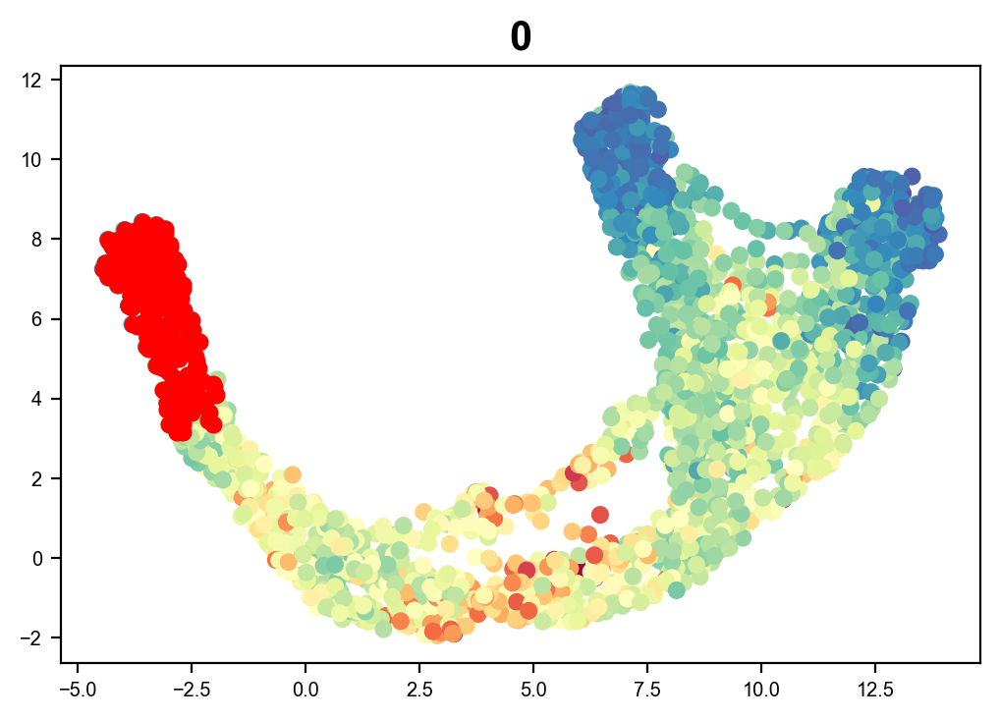

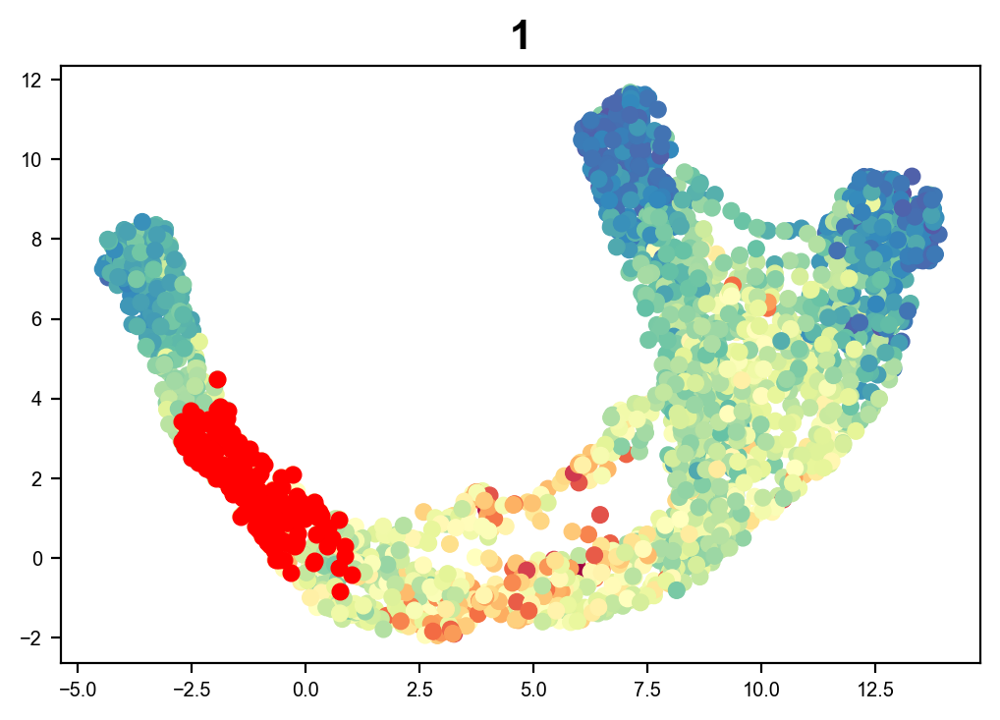

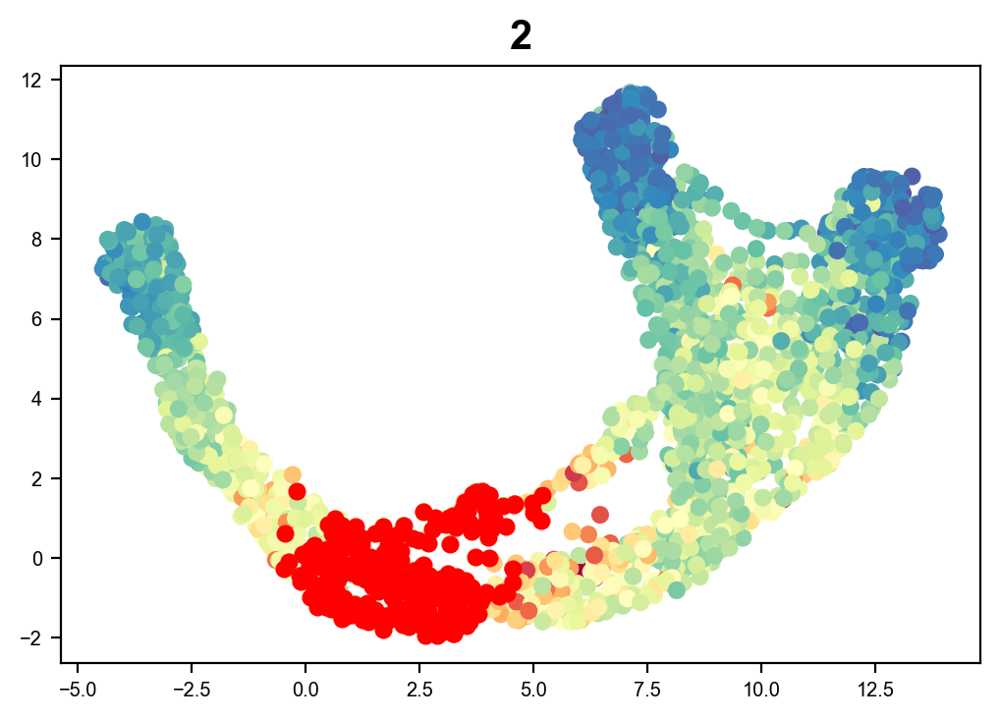

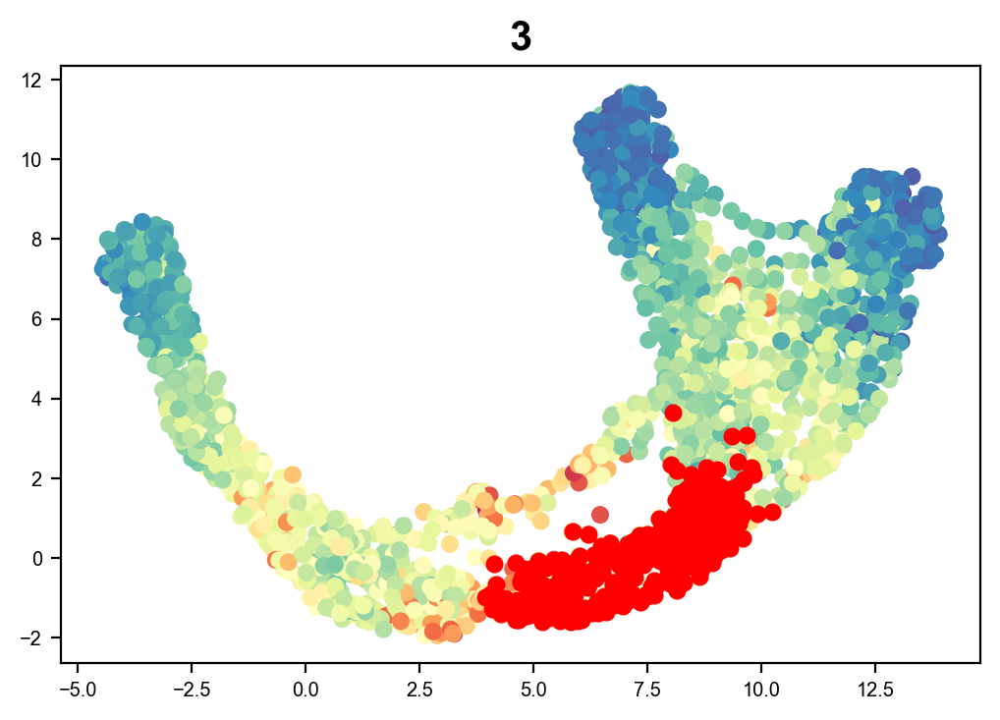

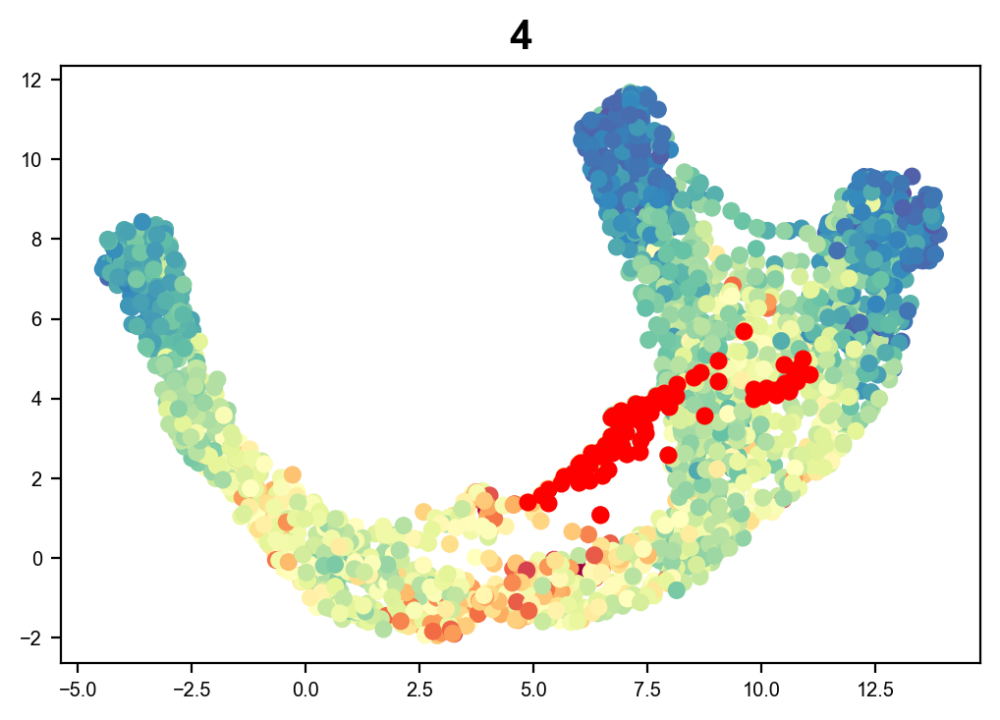

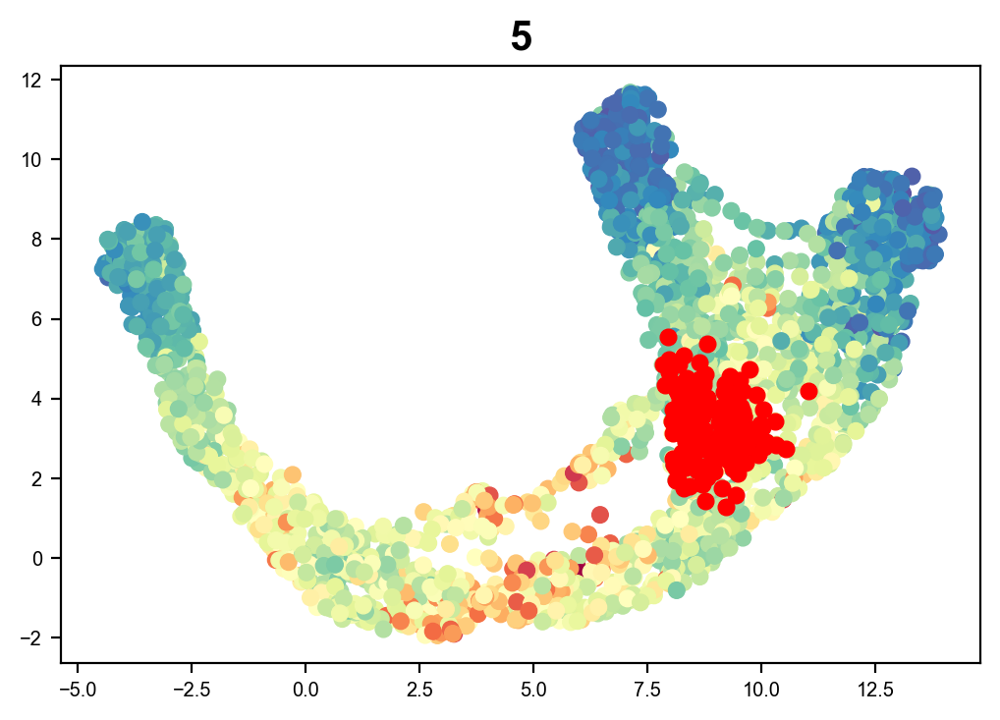

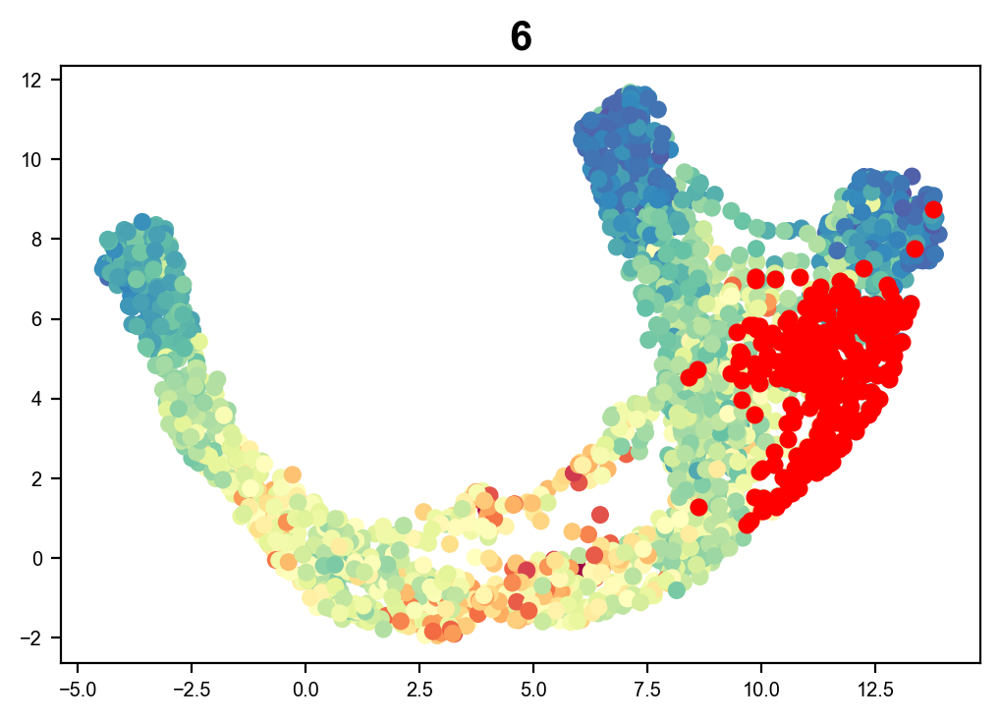

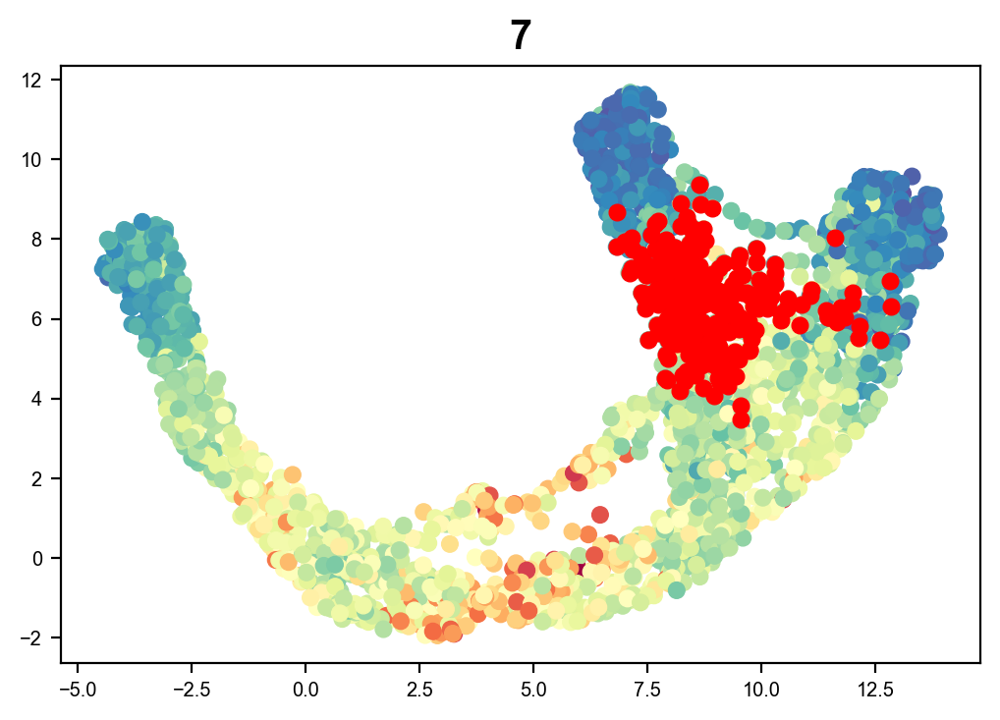

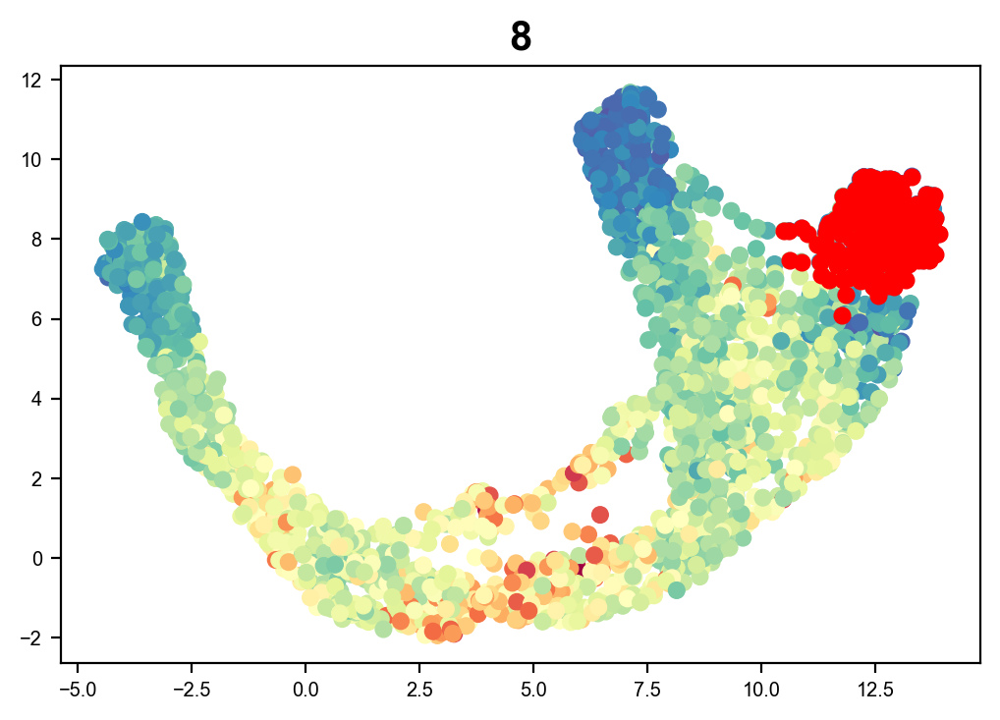

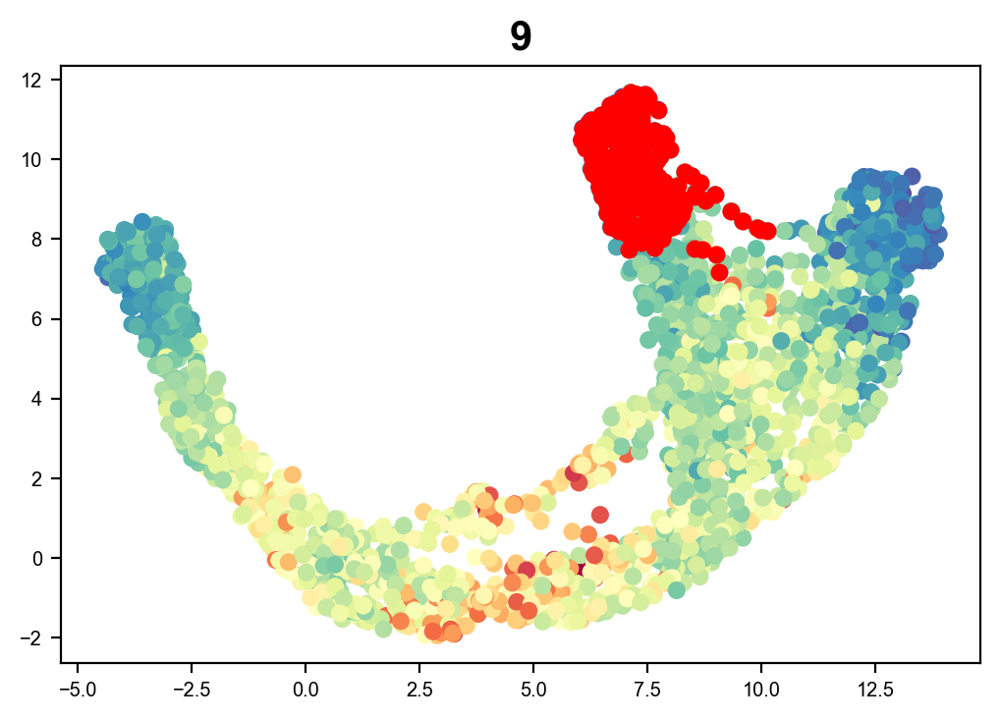

In [25]:
for i in range(len(cl_order)):
    cl_ind = (clusters==categories[cl_order[i]])
    plt.scatter(X_plt,Y_plt,c=crc_smooth,cmap=plt.colormaps['Spectral'])
    plt.scatter(X_plt[cl_ind],Y_plt[cl_ind],c='r')
    plt.title(i,fontsize=15,weight='bold')
    plt.show()

In [244]:
import seaborn as sns
cat_colors = sns.color_palette('RdBu_r',n_colors=len(categories))
#cat_colors = plt.colormaps['RdBu_r'](categories)

Text(-7.717802219390869, 0.32787187894185377, '$UMAP_2$')

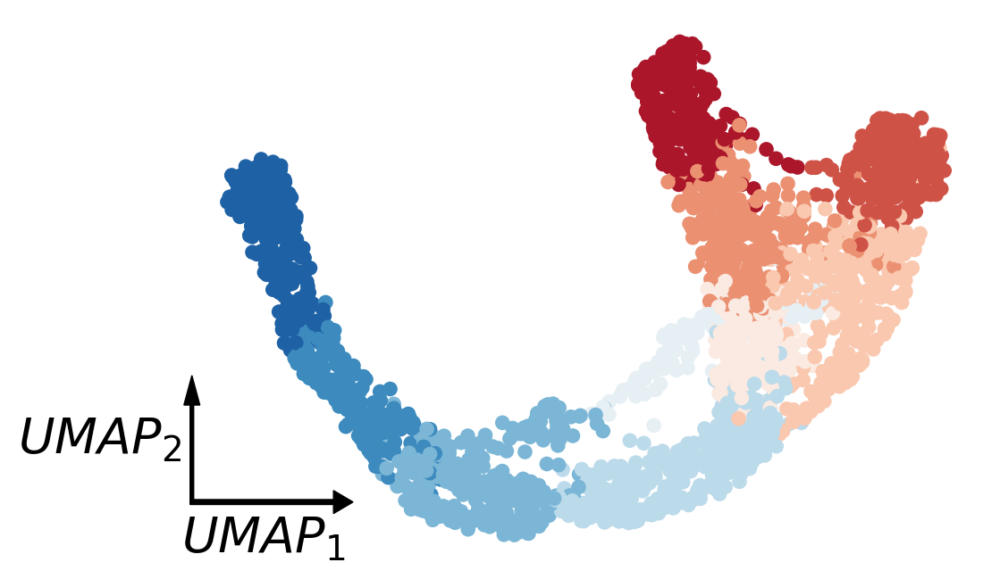

In [248]:
# plt.figure(figsize=(6,4))
plt.scatter(X_plt,Y_plt,c=np.array([cat_colors[cell_cl_label_order[i]] for i in range(cell_cl_label.shape[0])]),s=30)
plt.axis('off')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid*1.5,color='black',head_width=7*wid,head_length=5.5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=4.5*wid,head_length=9*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*15,'$UMAP_1$',fontsize=20,ha='center',weight='bold')
plt.text(X_ori-wid*26,Y_ori+Y_len/2,'$UMAP_2$',fontsize=20,ha='center',weight='bold')

#clb=plt.colorbar()
#clb.ax.set_ylabel('pseudotime',fontsize=20,weight='bold')
#clb.ax.tick_params(axis='y', labelsize=15)
#plt.savefig(figure_path+'3b.png',dpi=600,bbox_inches='tight')

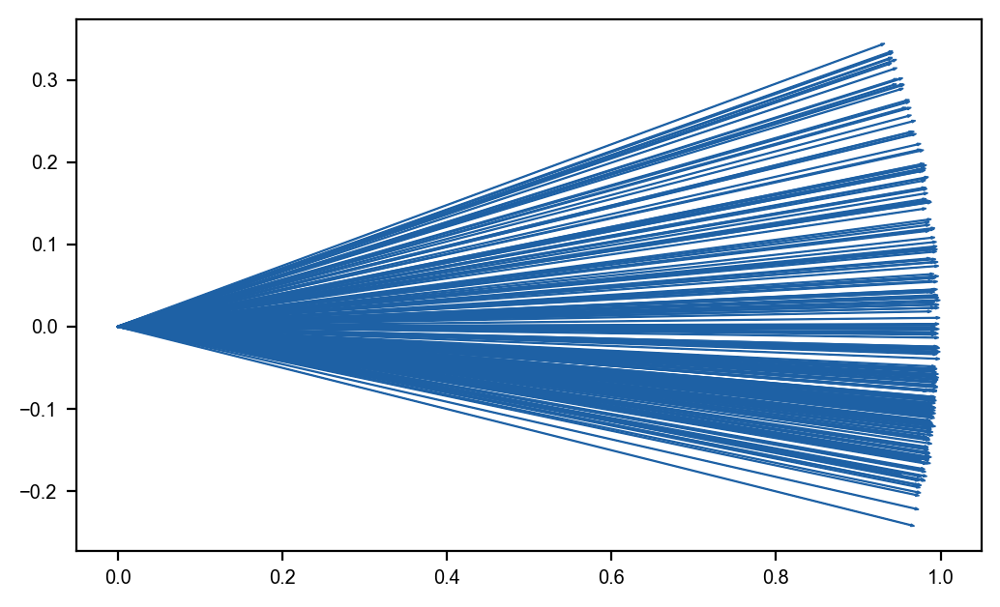

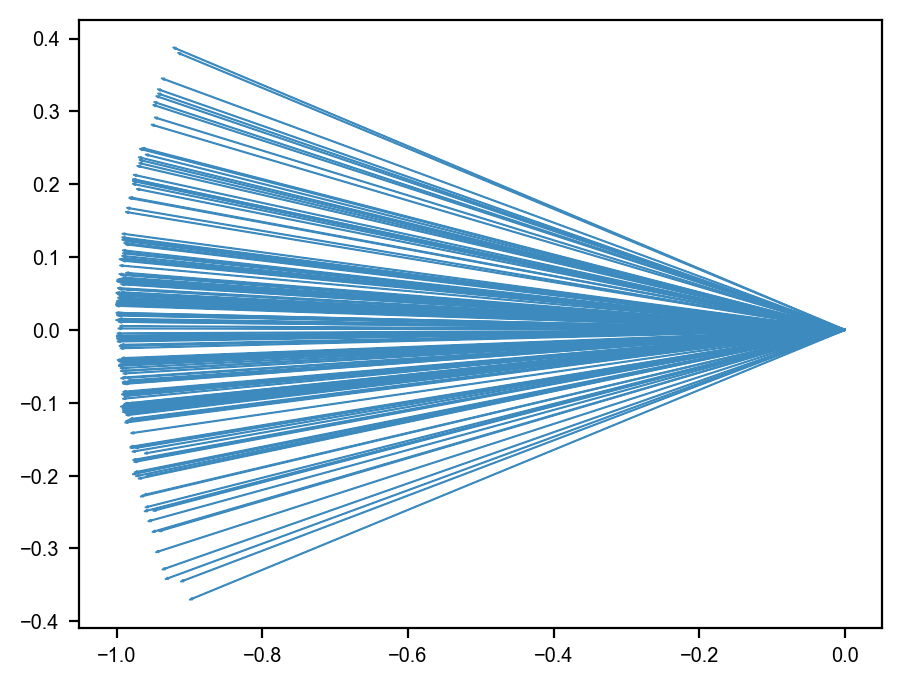

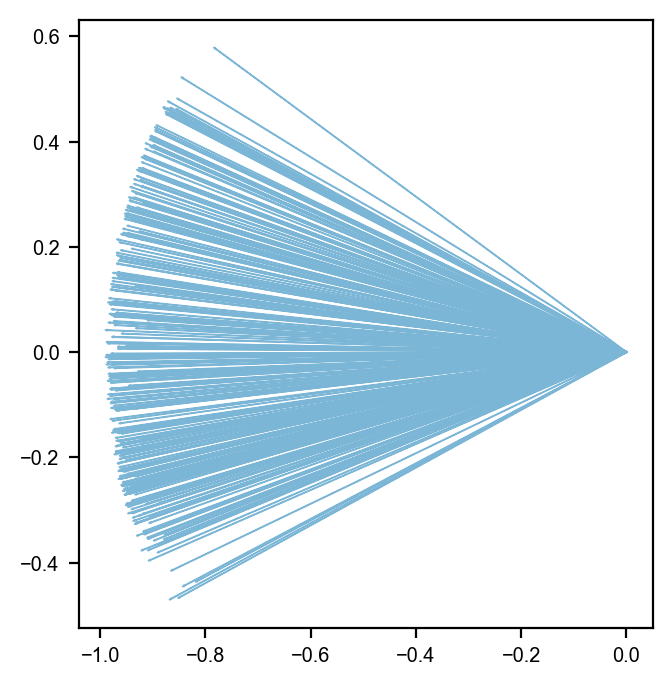

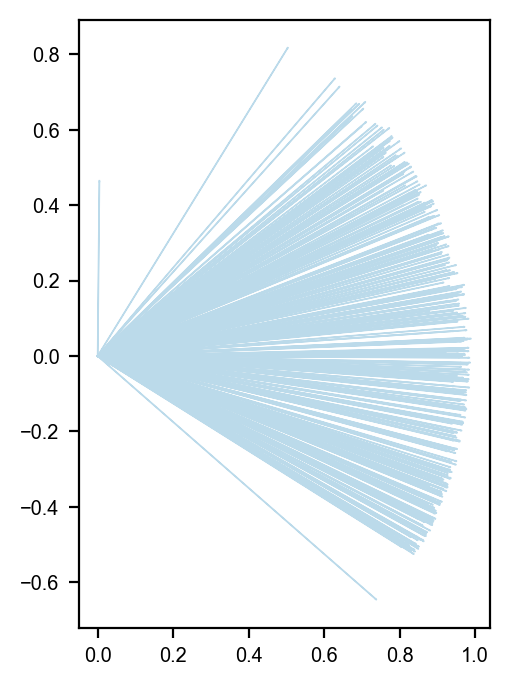

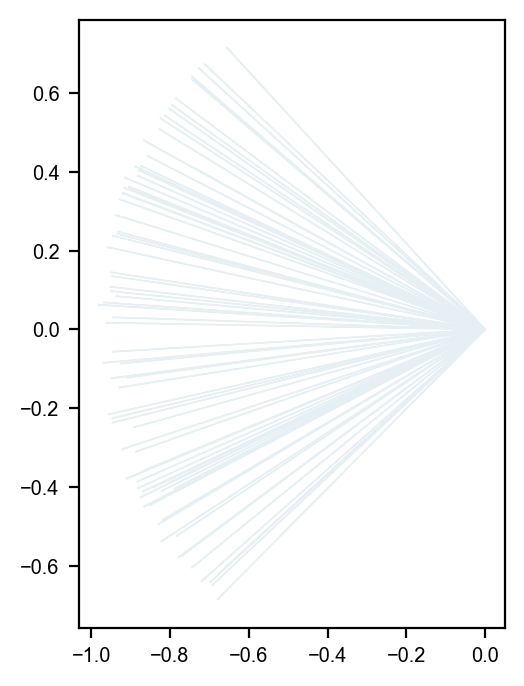

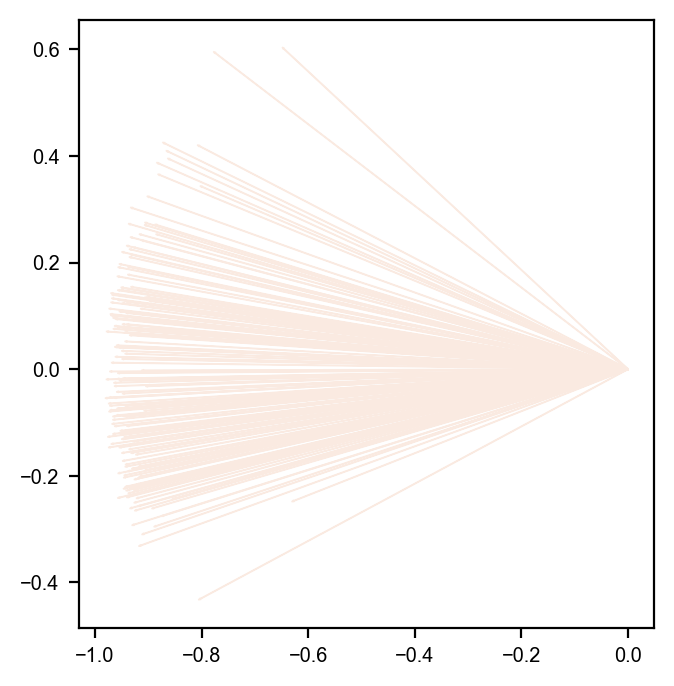

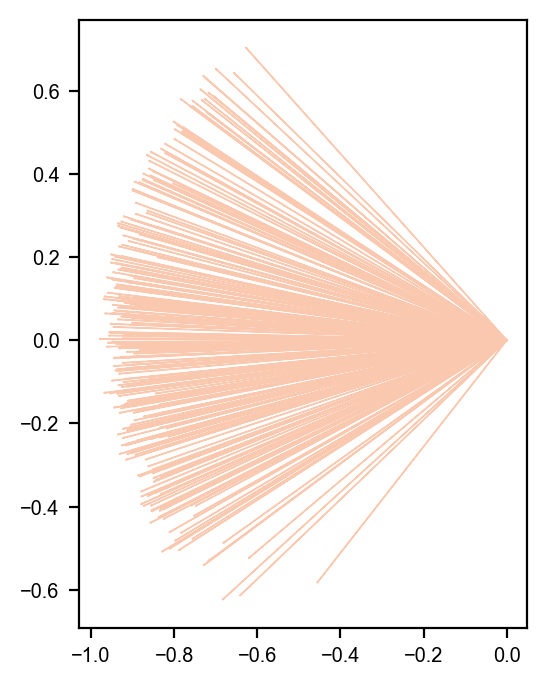

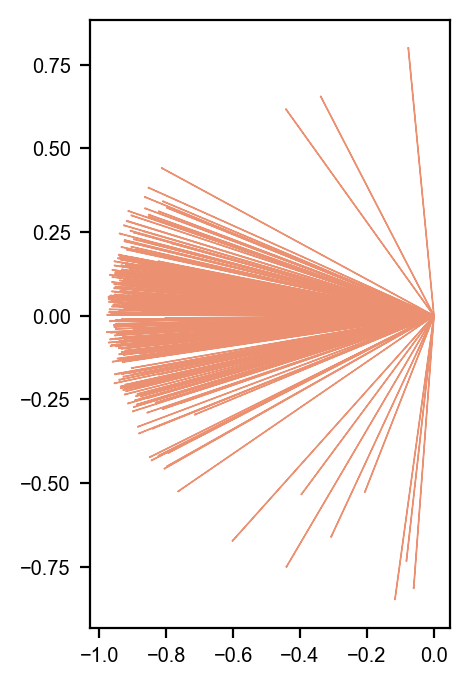

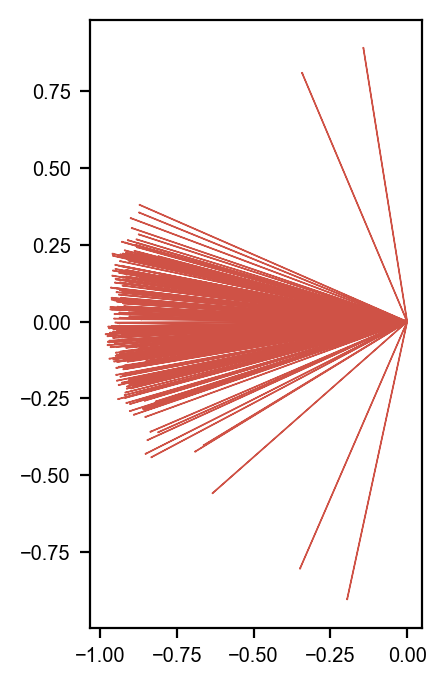

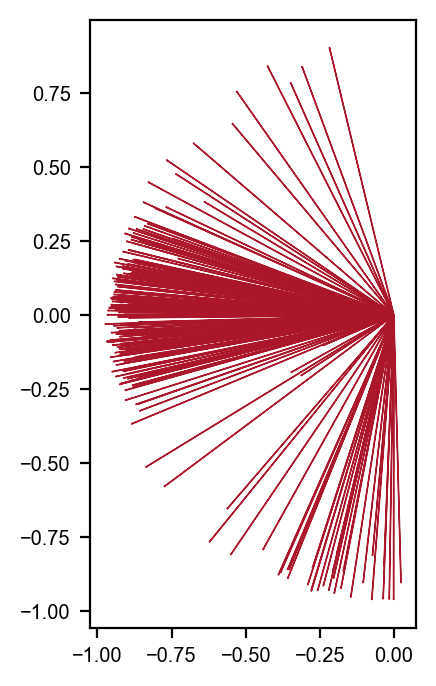

In [245]:
for i in range(len(cl_order)):
    cl_cat = categories[cl_order[i]]
    eigenvec_0 = np.linalg.eigh(eigenvec[cl_cat].T@eigenvec[cl_cat])[1][:,-2:]
    eigenvec_1 = eigenvec[cl_cat]@eigenvec_0
    
    for j in range(eigenvec_1.shape[0]):
        plt.arrow(0,0,eigenvec_1[j,1],eigenvec_1[j,0],color=cat_colors[i])
    #plt.title(i,fontsize=15,weight='bold')
    plt.gca().set_aspect('equal')
    plt.show()

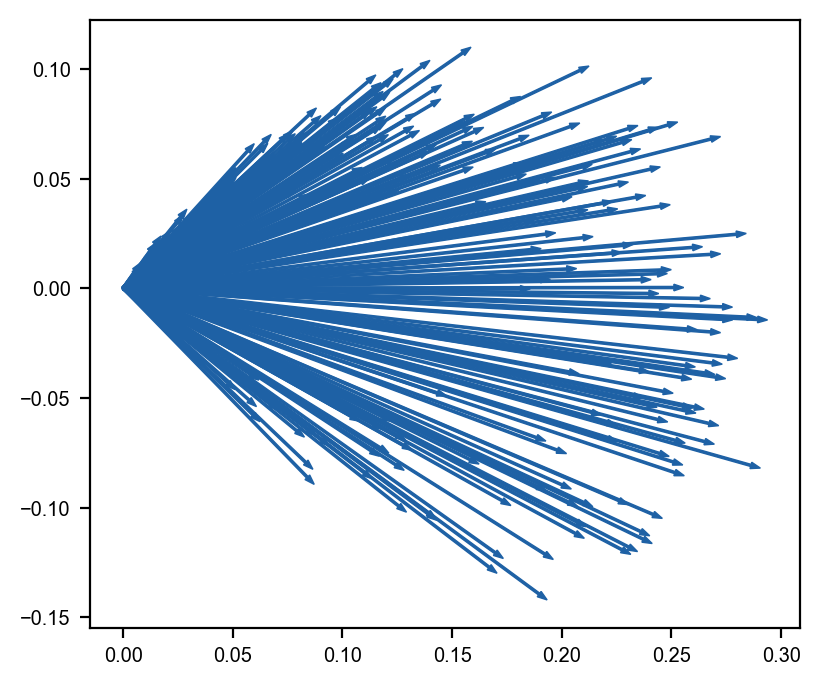

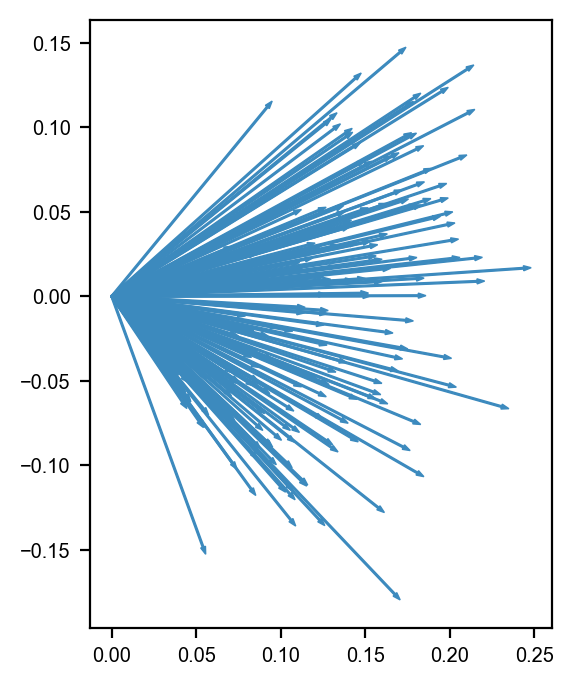

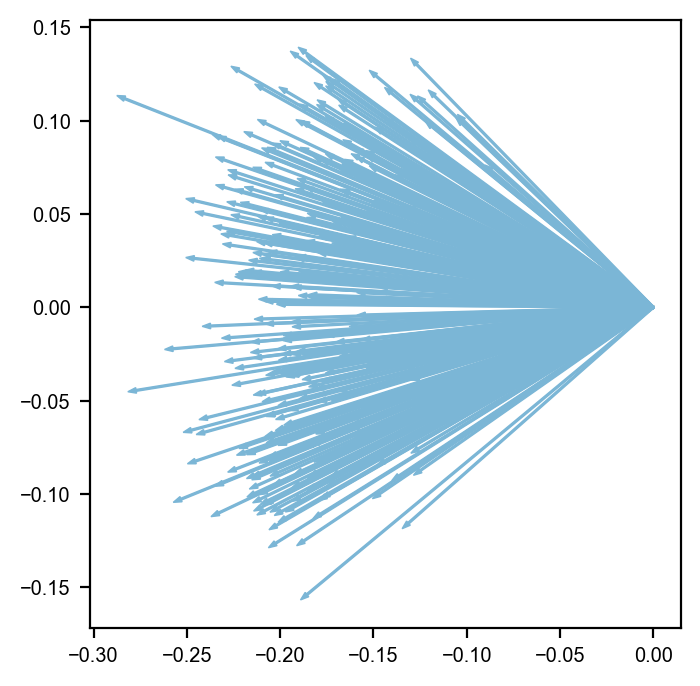

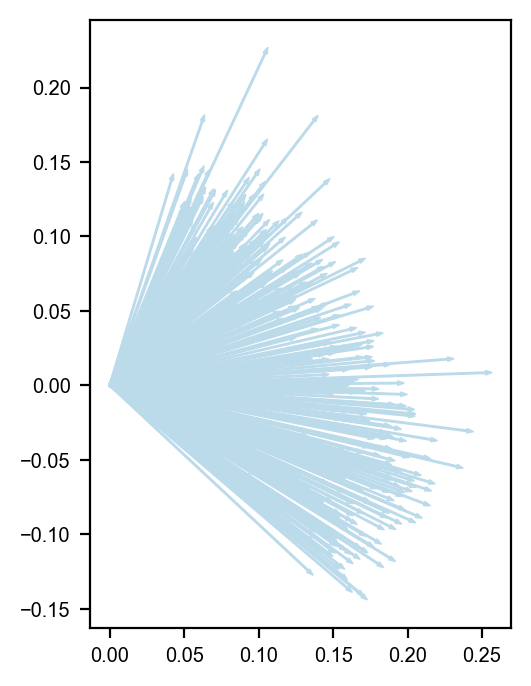

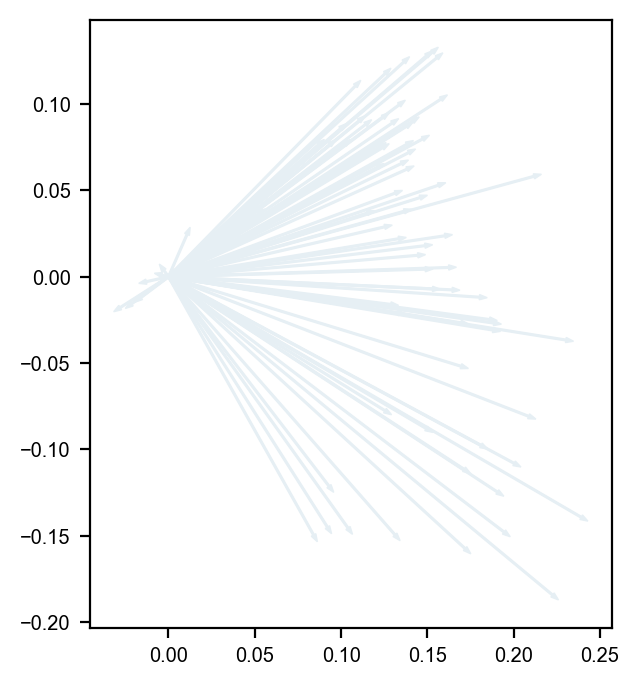

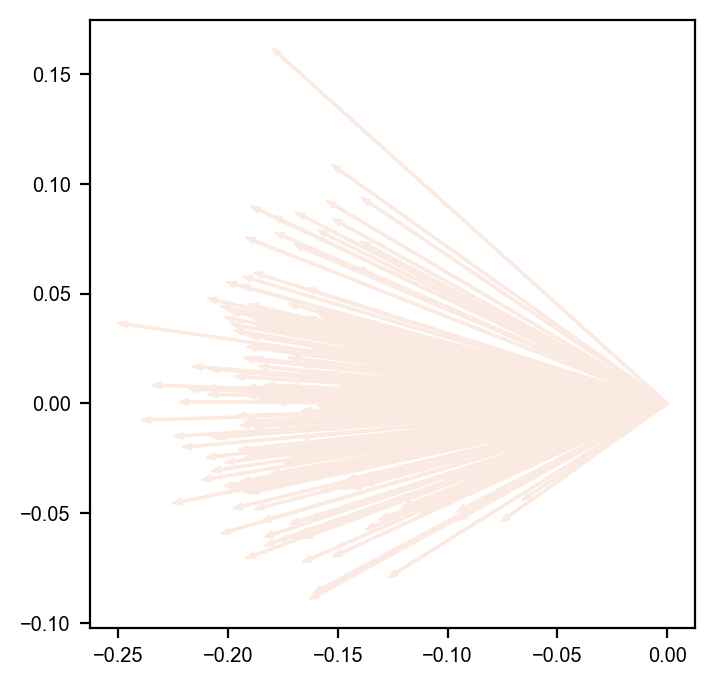

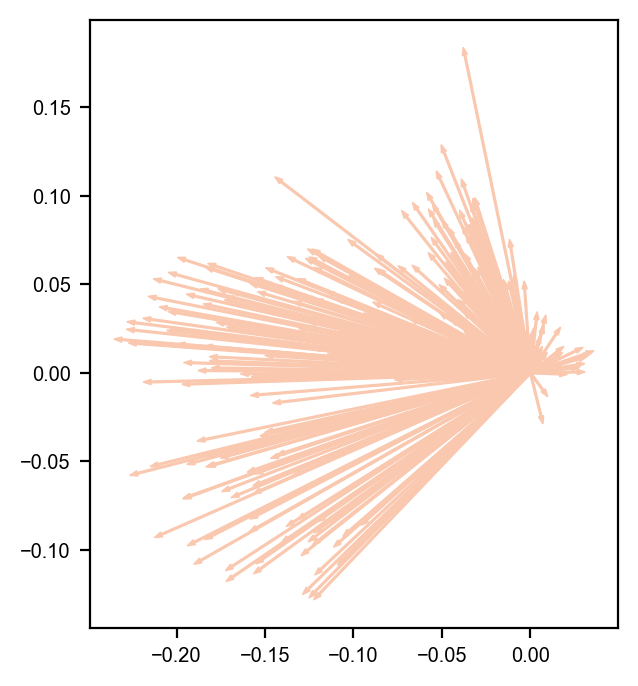

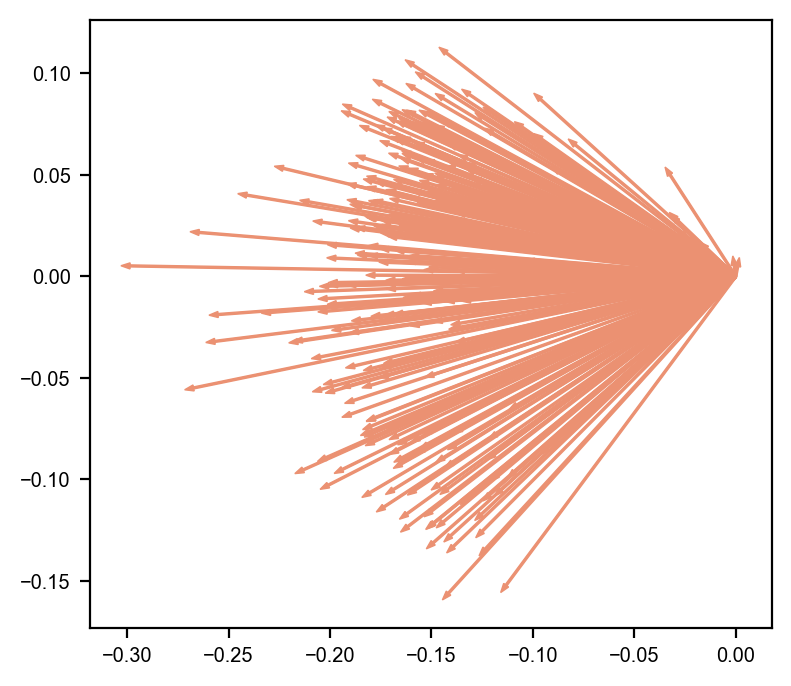

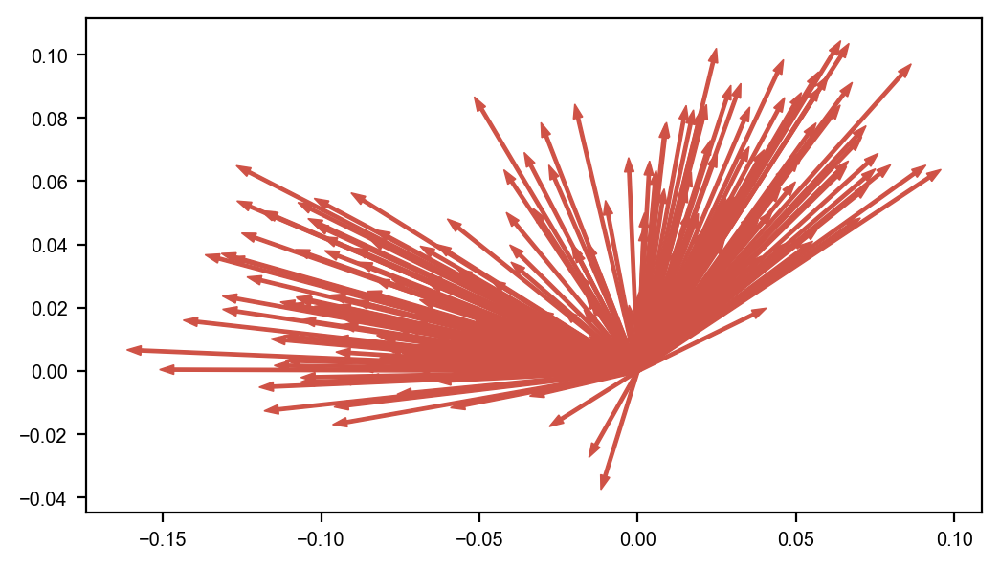

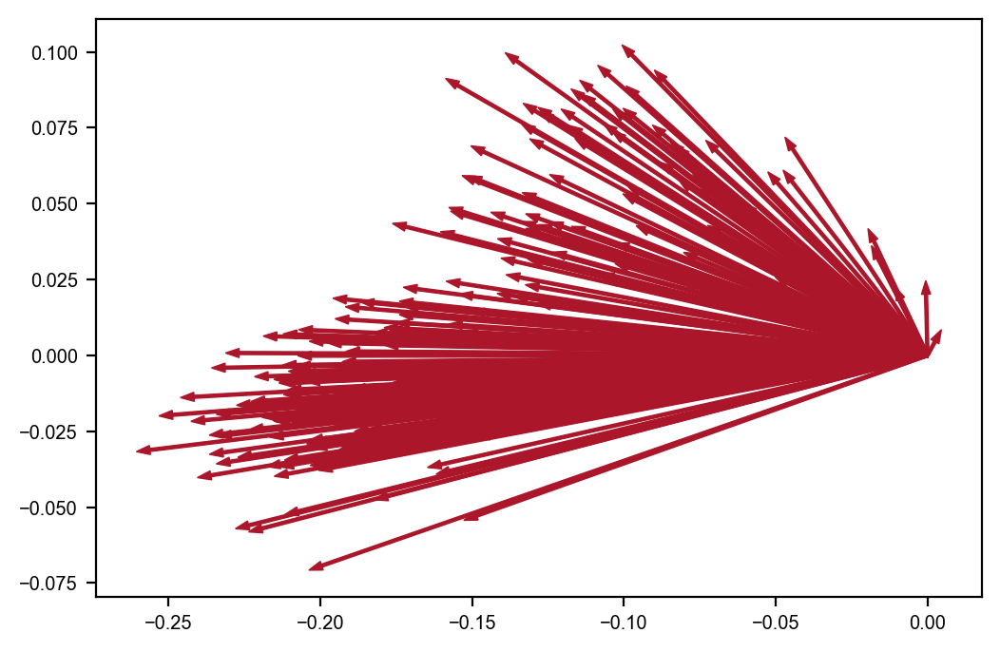

In [287]:
for i in range(len(cl_order)):
    cl_ind = (clusters==categories[cl_order[i]])
    eigenvec_0 = np.linalg.eigh(velo_pca[cl_ind].T@velo_pca[cl_ind])[1][:,-2:]
    eigenvec_1 = velo_pca[cl_ind]@eigenvec_0
    
    for j in range(eigenvec_1.shape[0]):
        plt.arrow(0,0,eigenvec_1[j,1],eigenvec_1[j,0],color=cat_colors[i])
        
    #plt.title(i,fontsize=15,weight='bold')
    plt.gca().set_aspect('equal')
    plt.show()

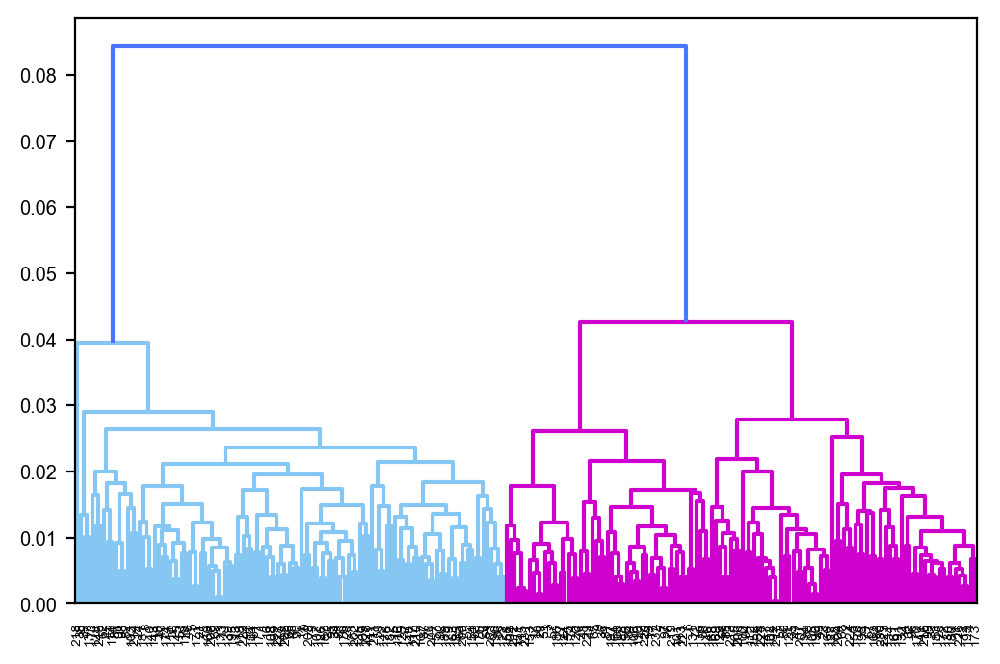

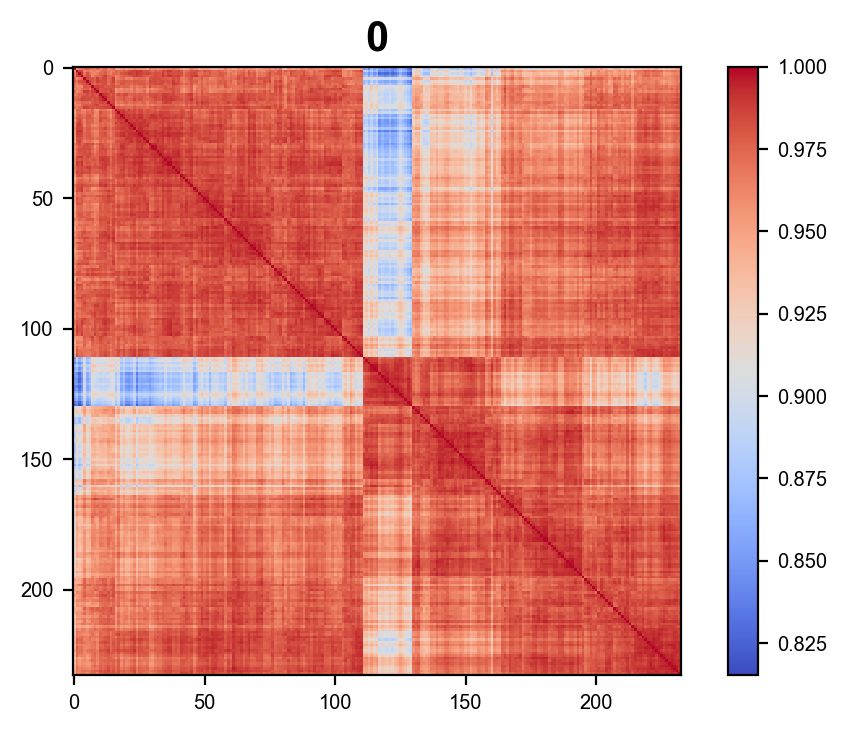

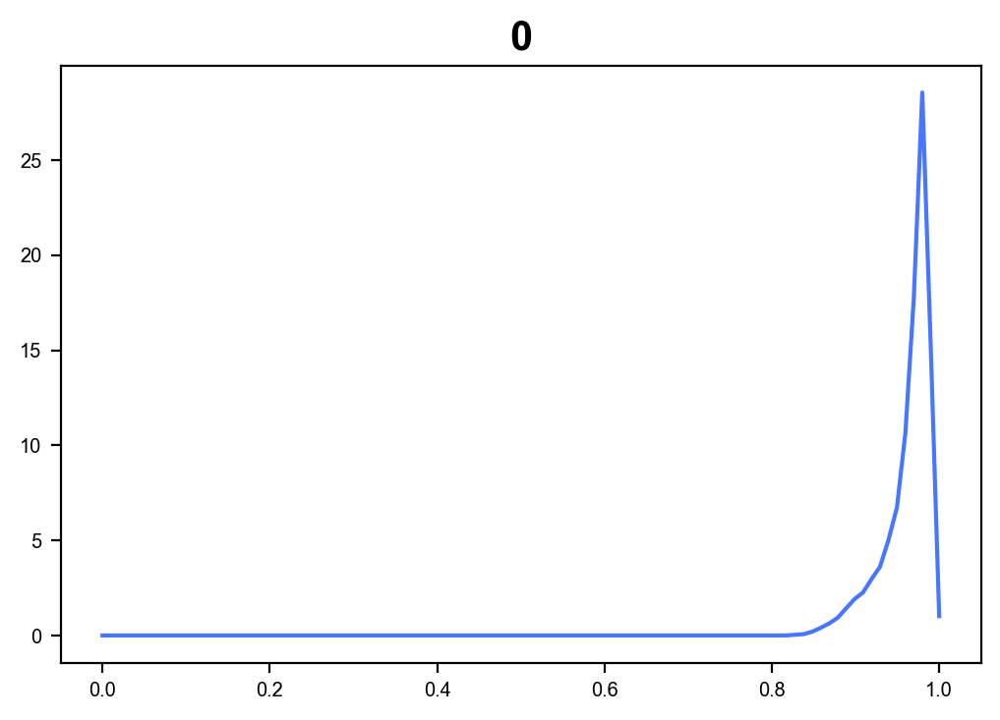

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1]


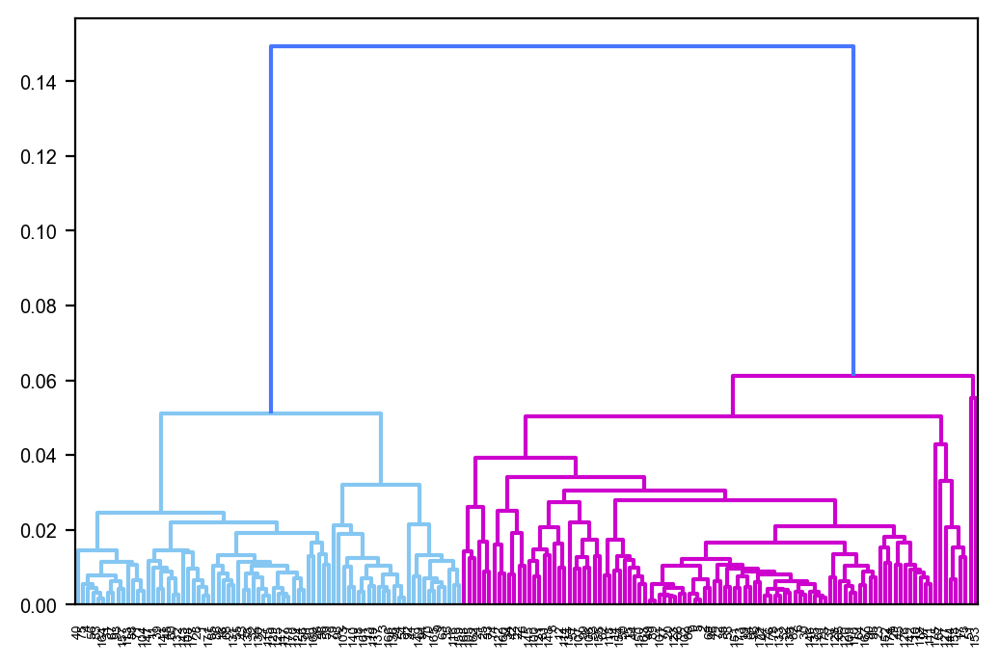

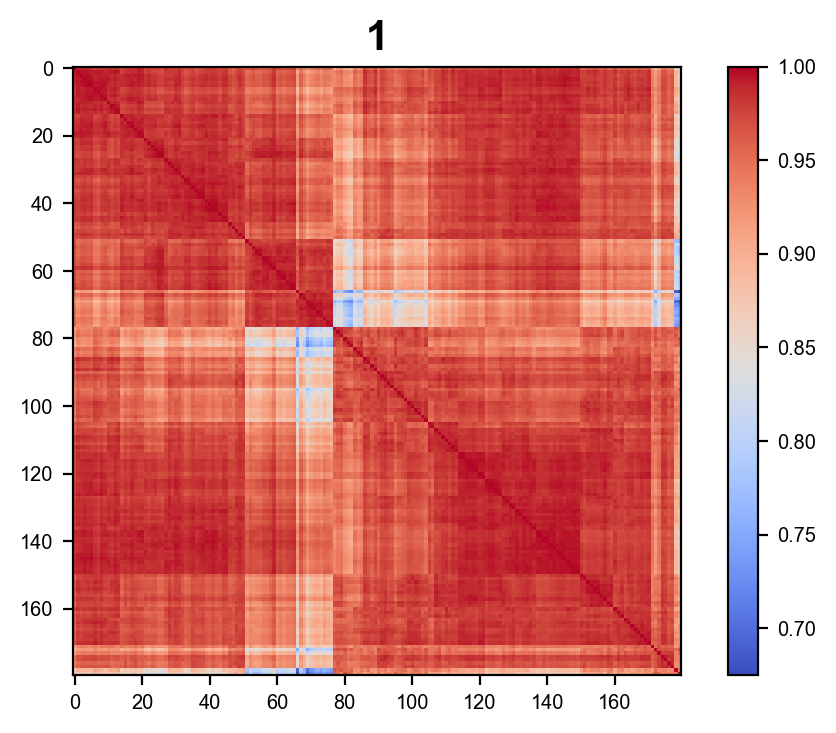

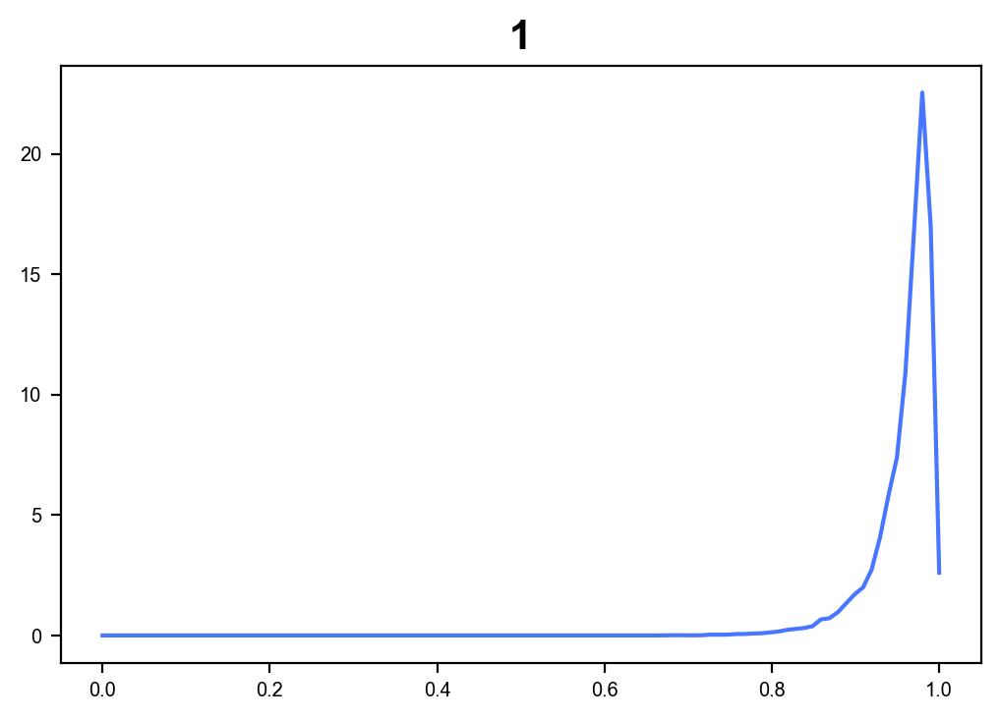

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


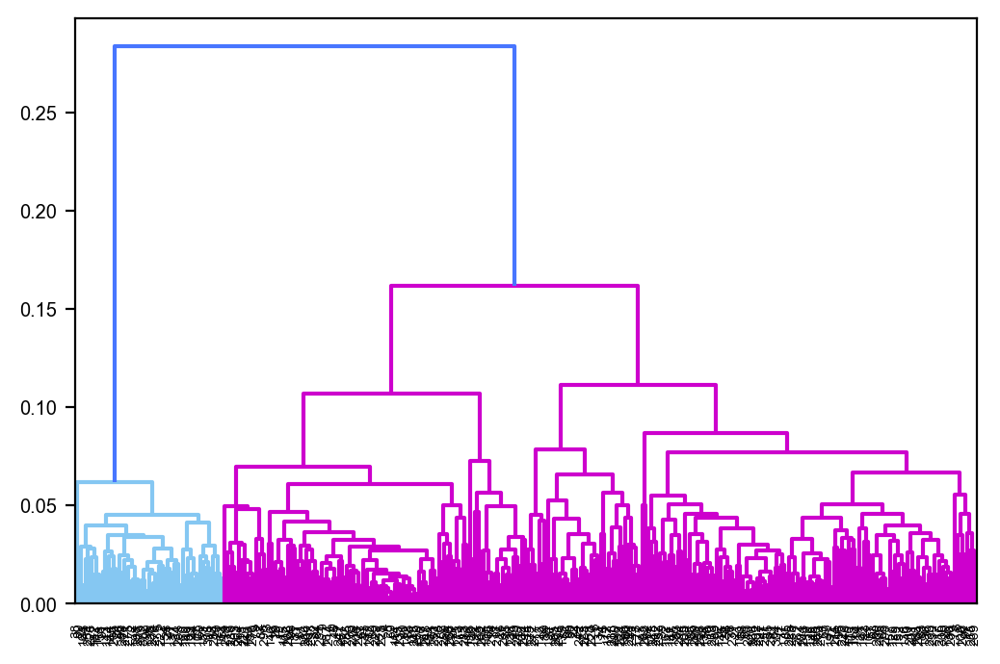

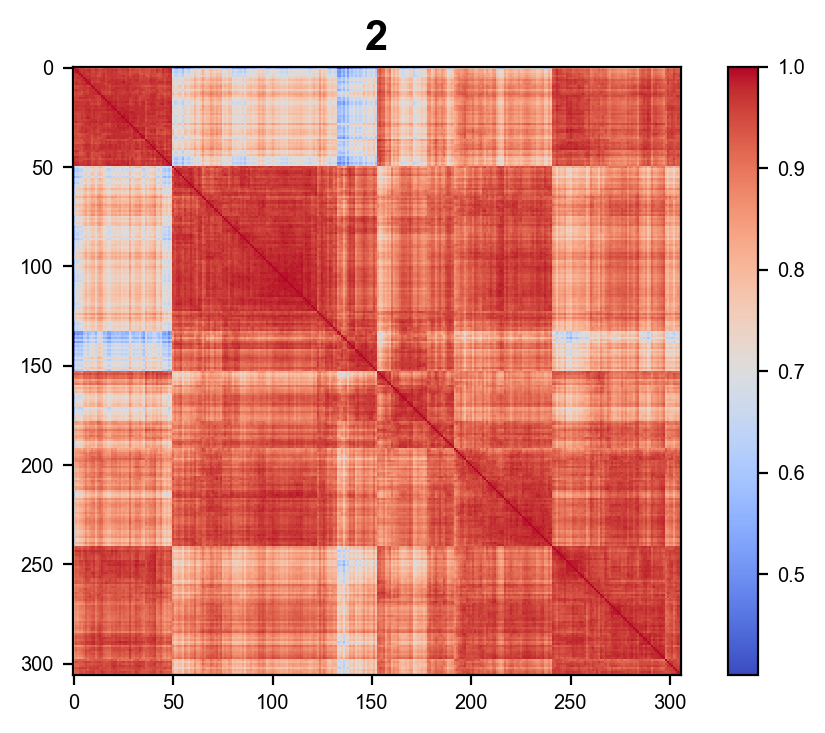

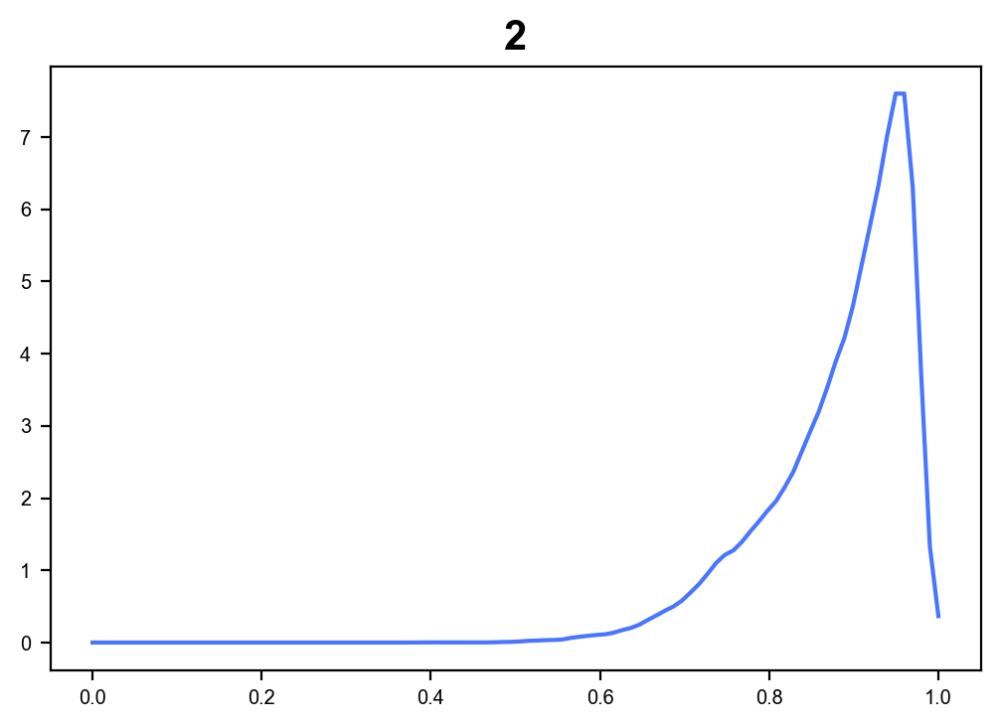

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1]


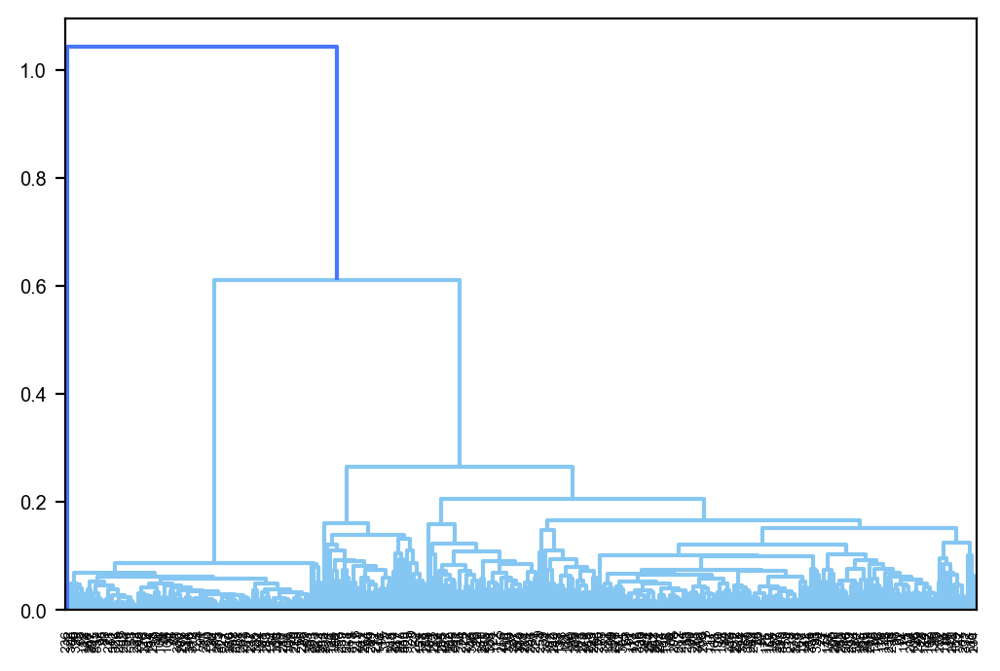

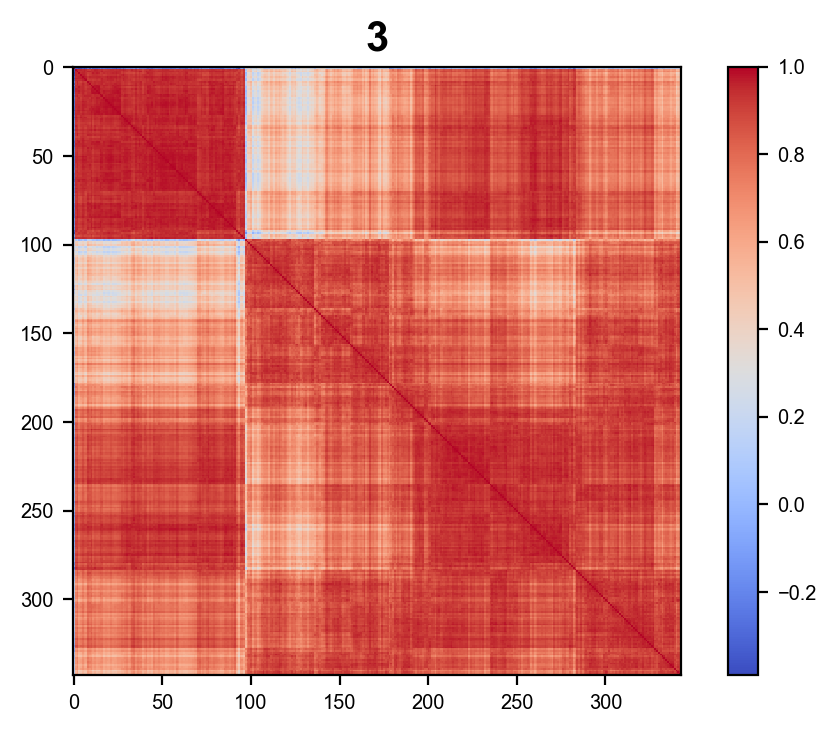

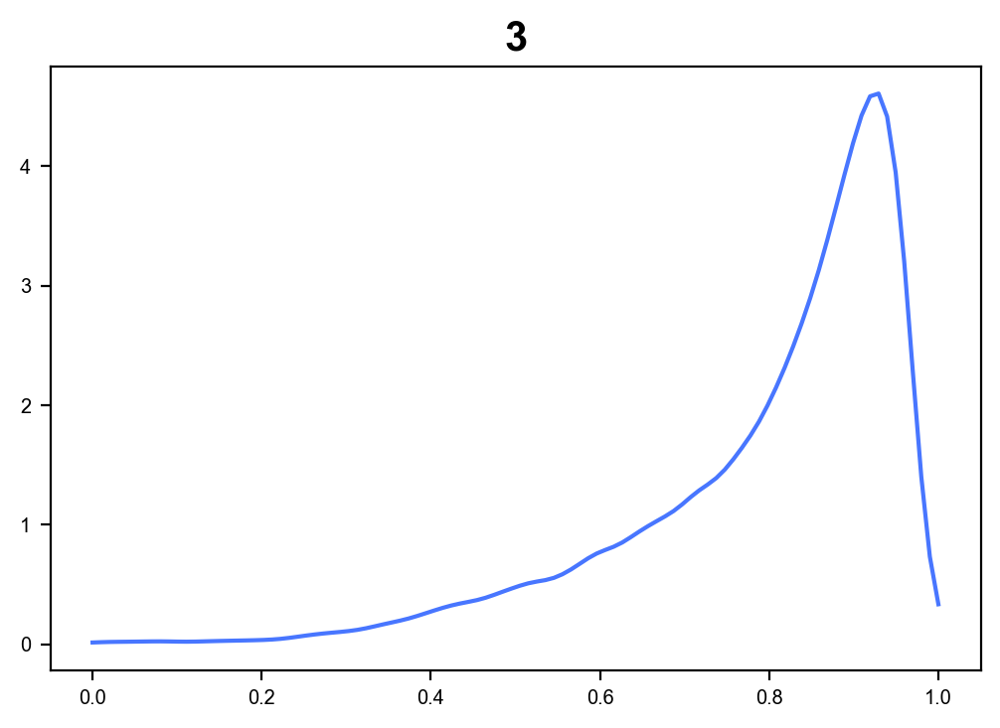

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1]


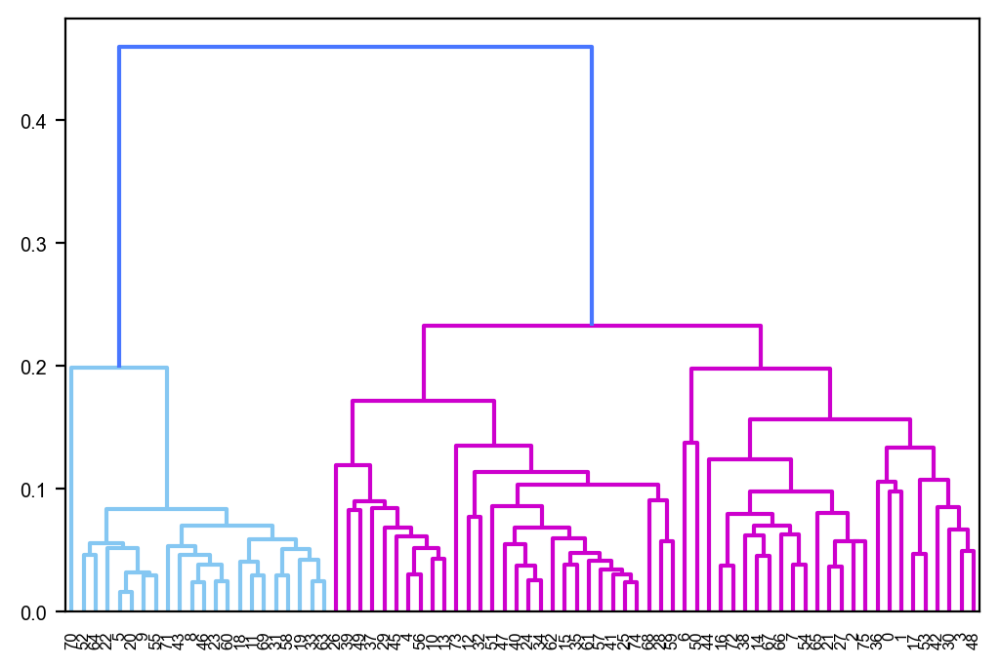

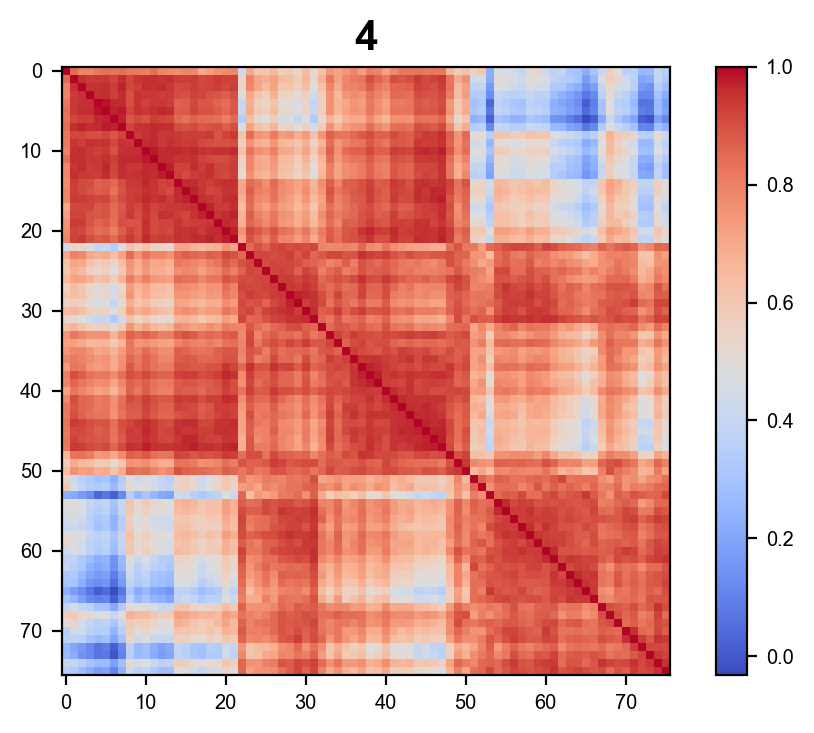

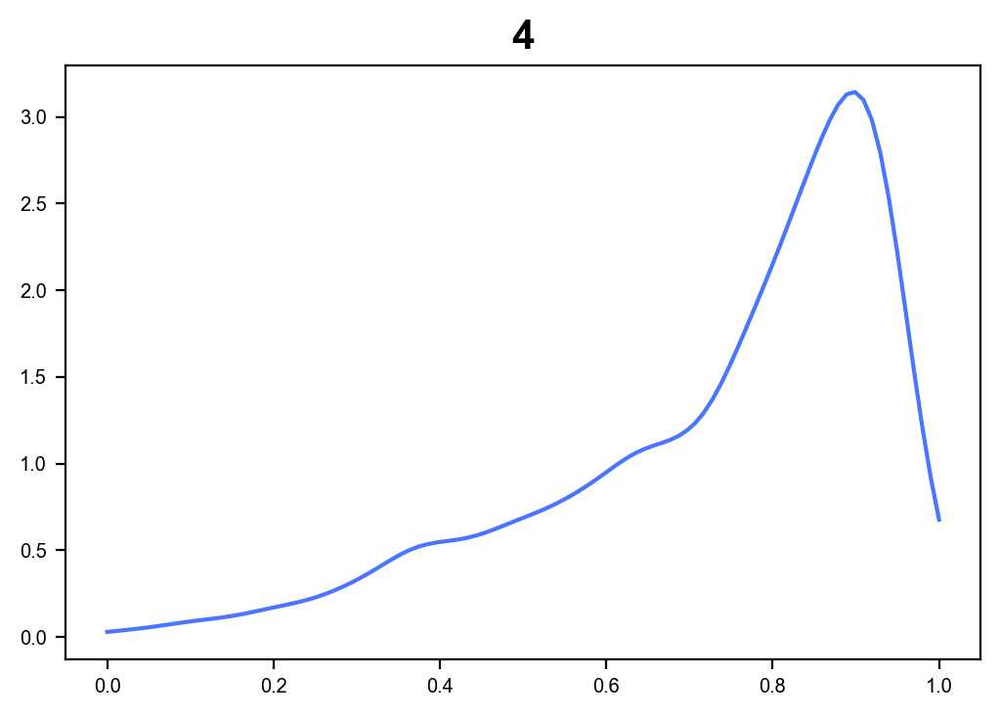

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]


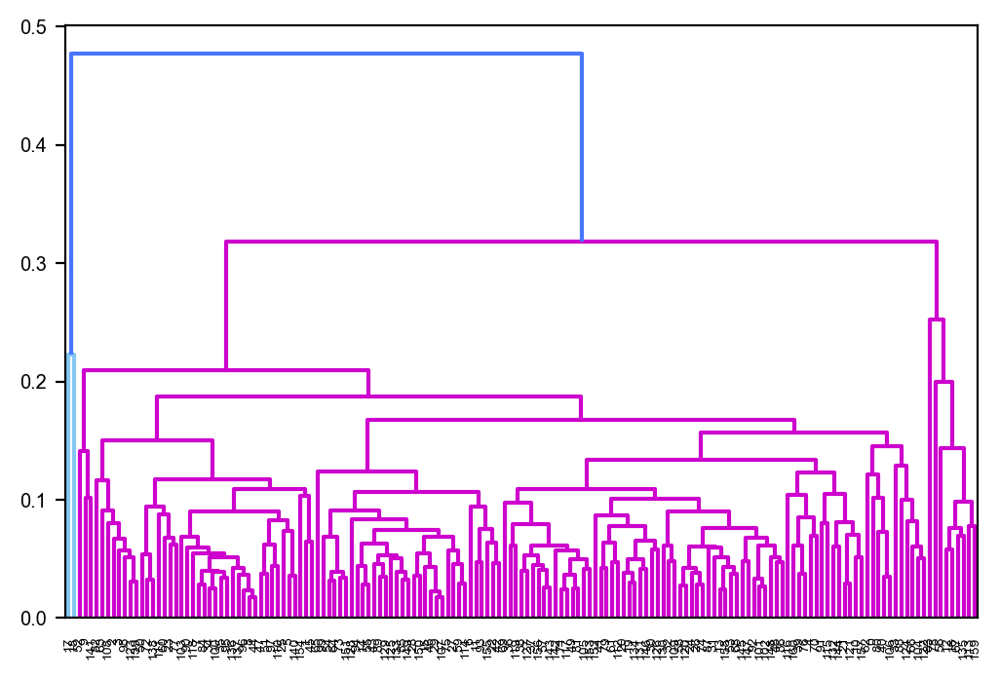

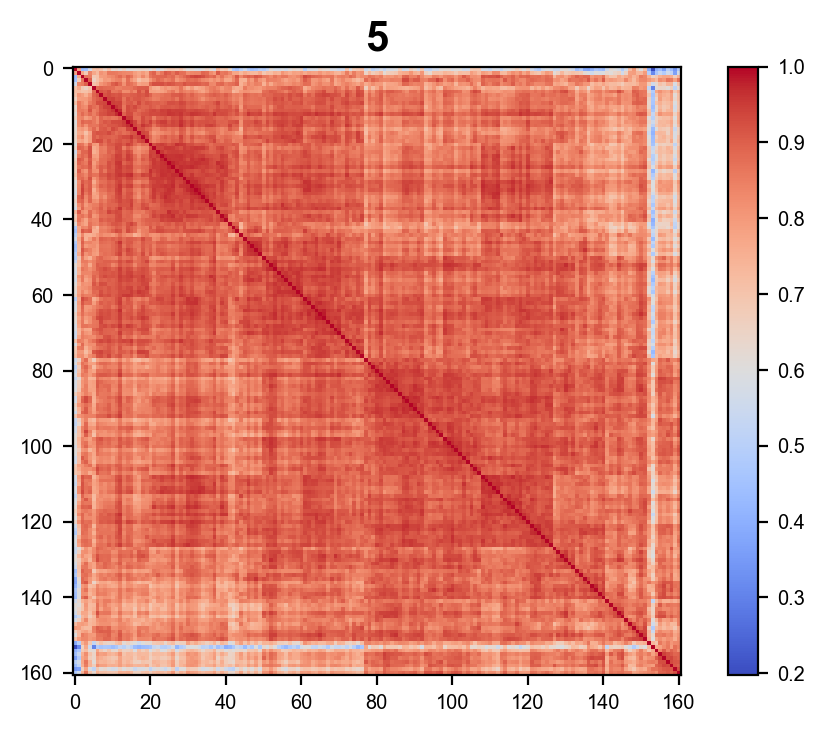

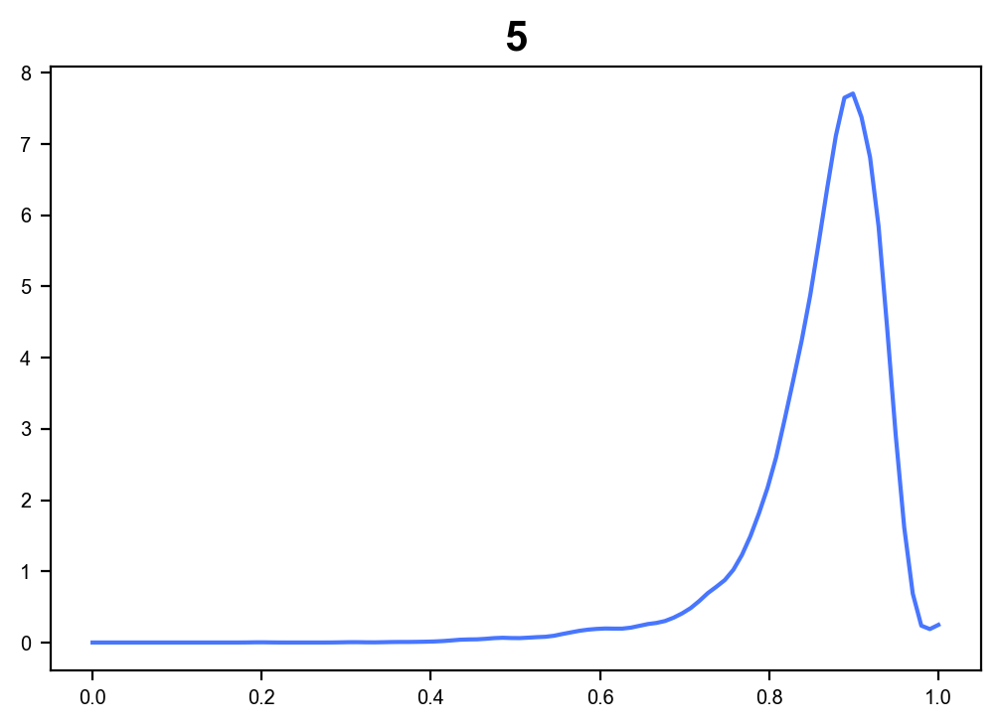

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1]


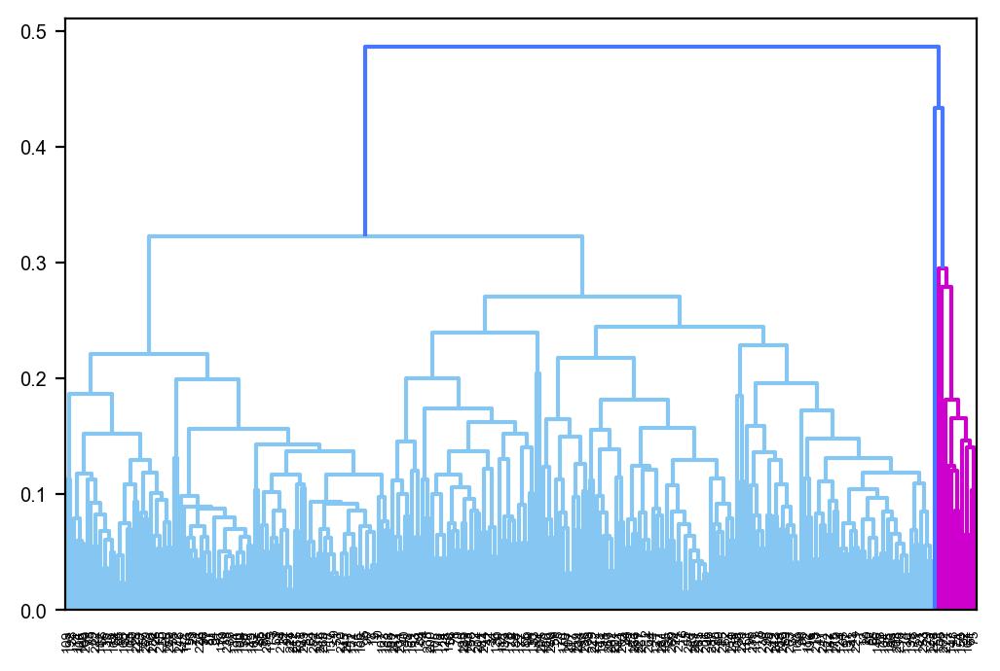

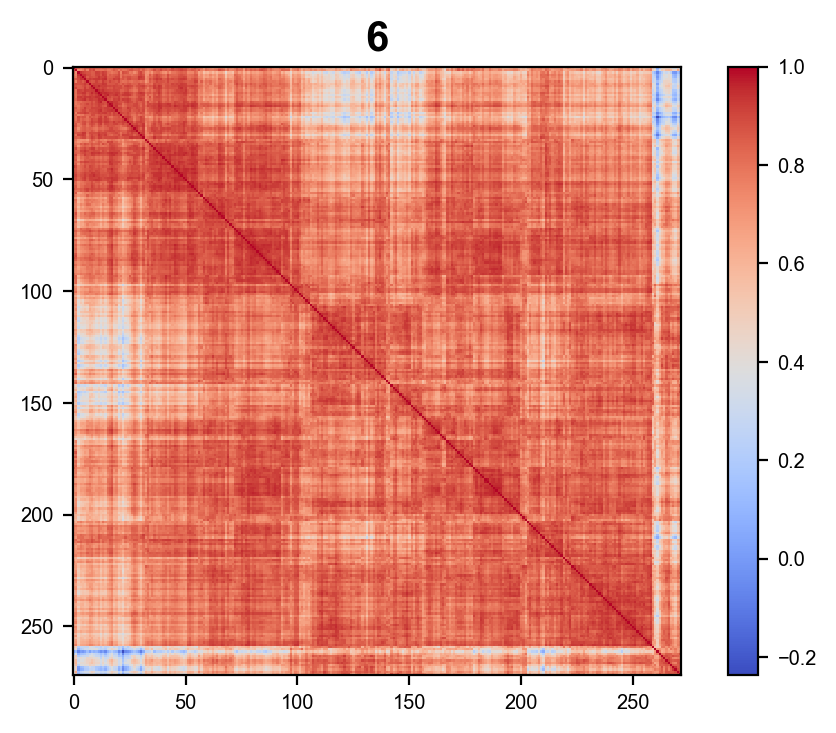

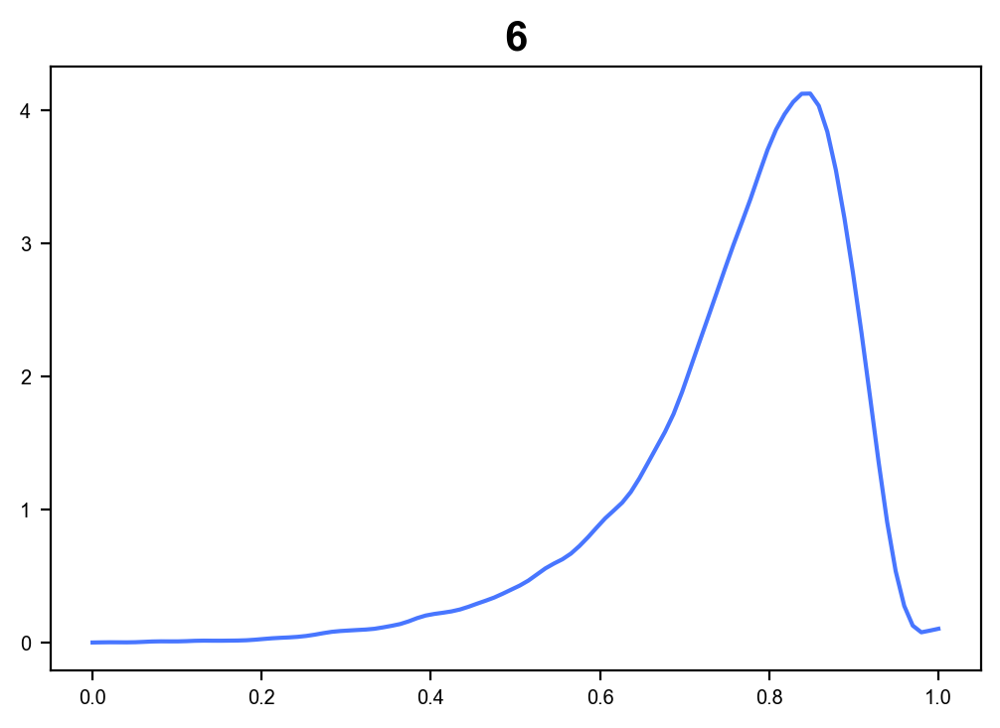

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1]


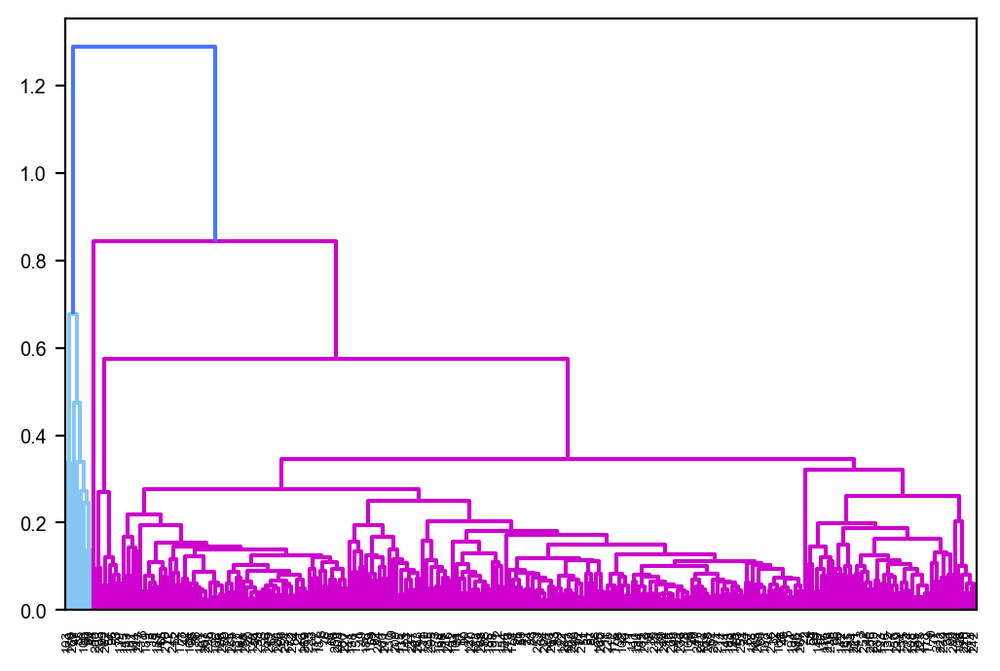

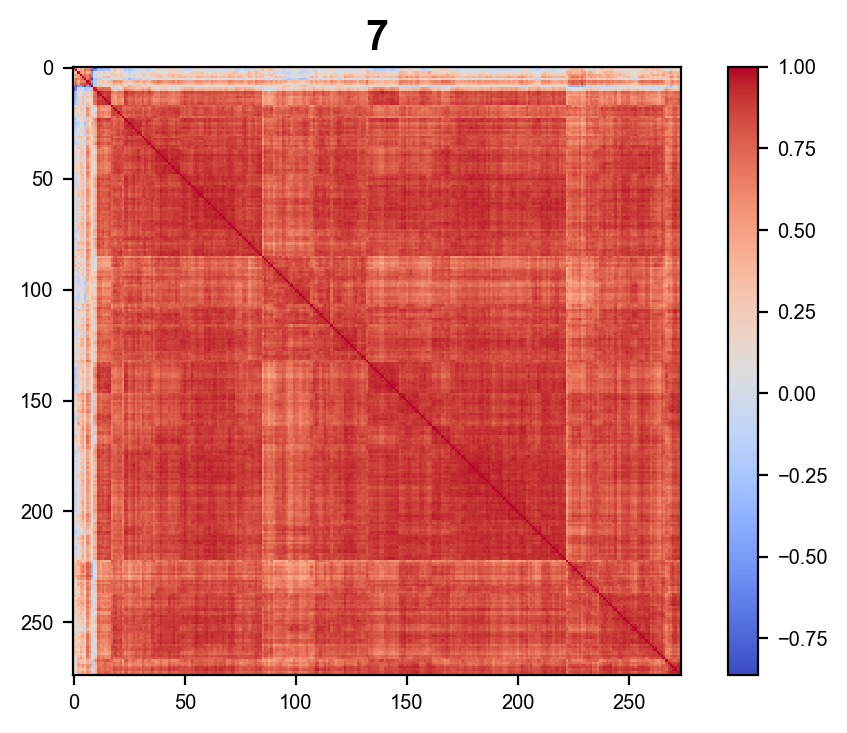

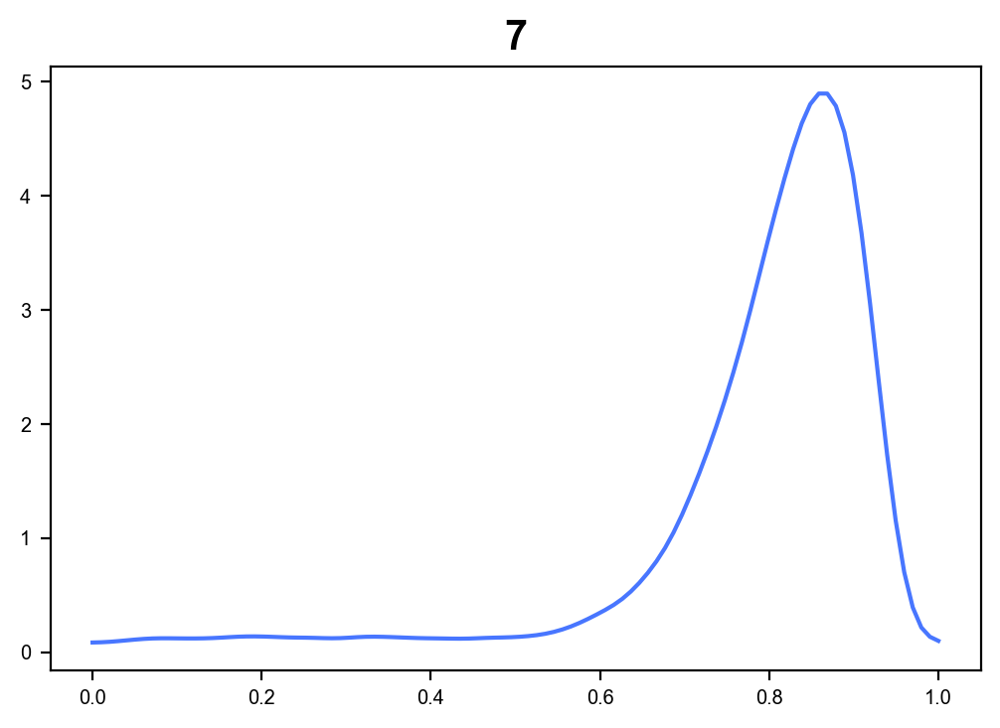

[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2]


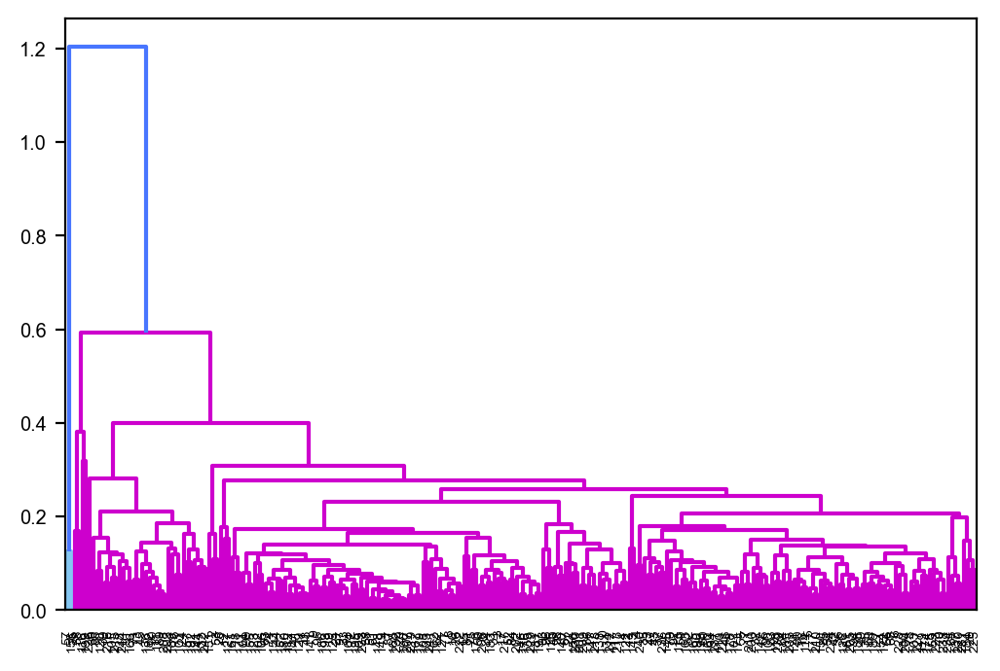

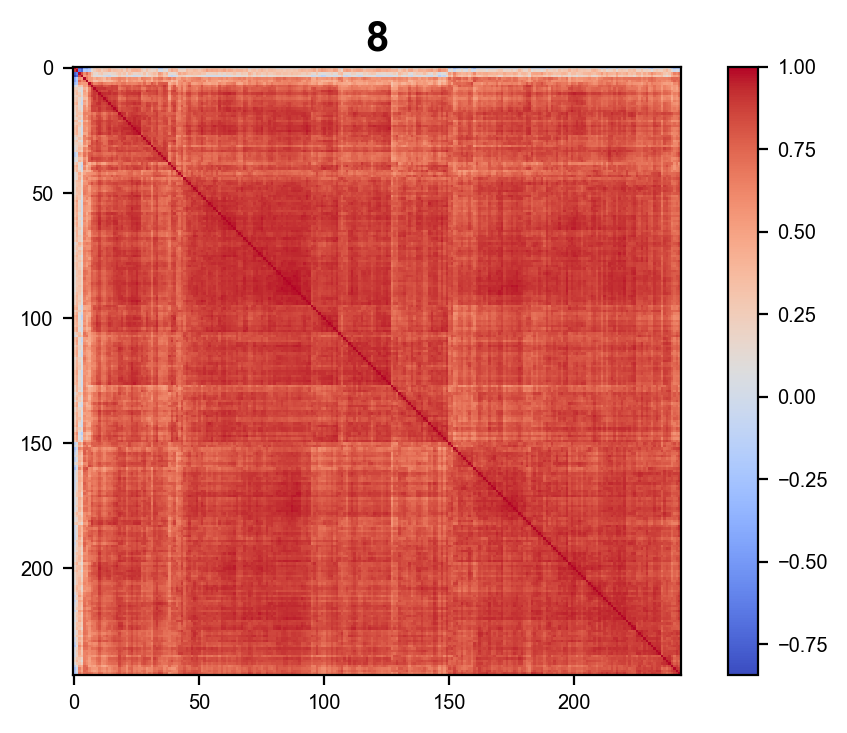

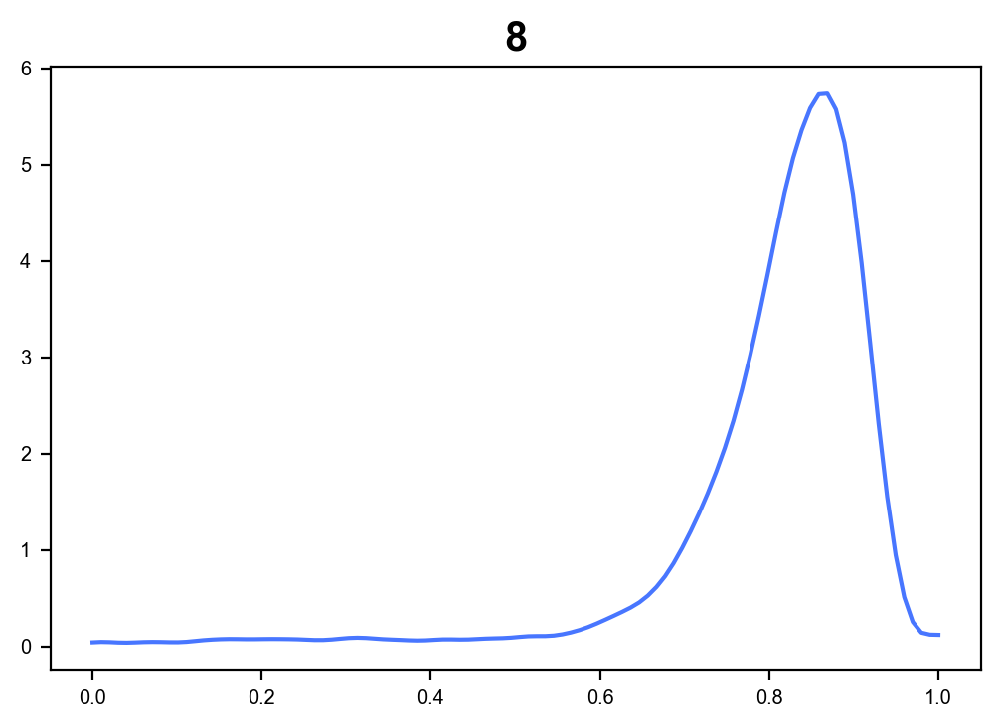

[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


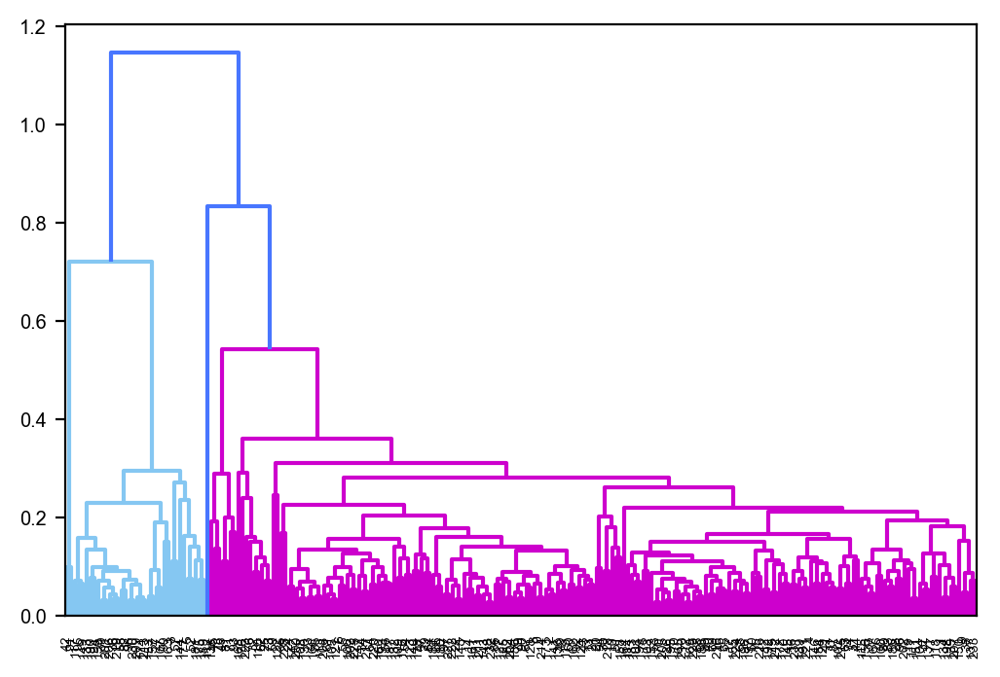

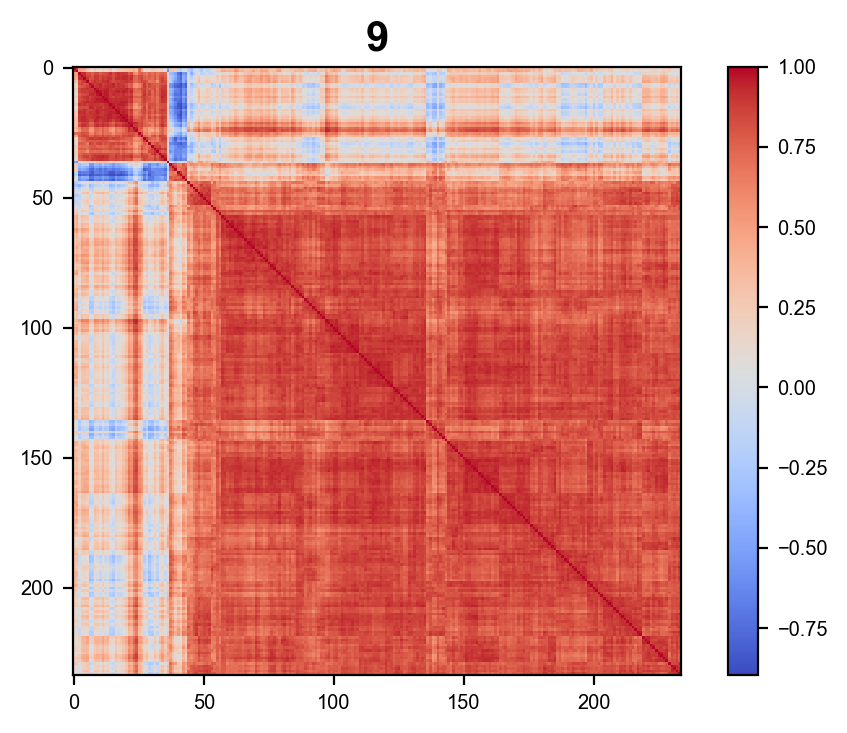

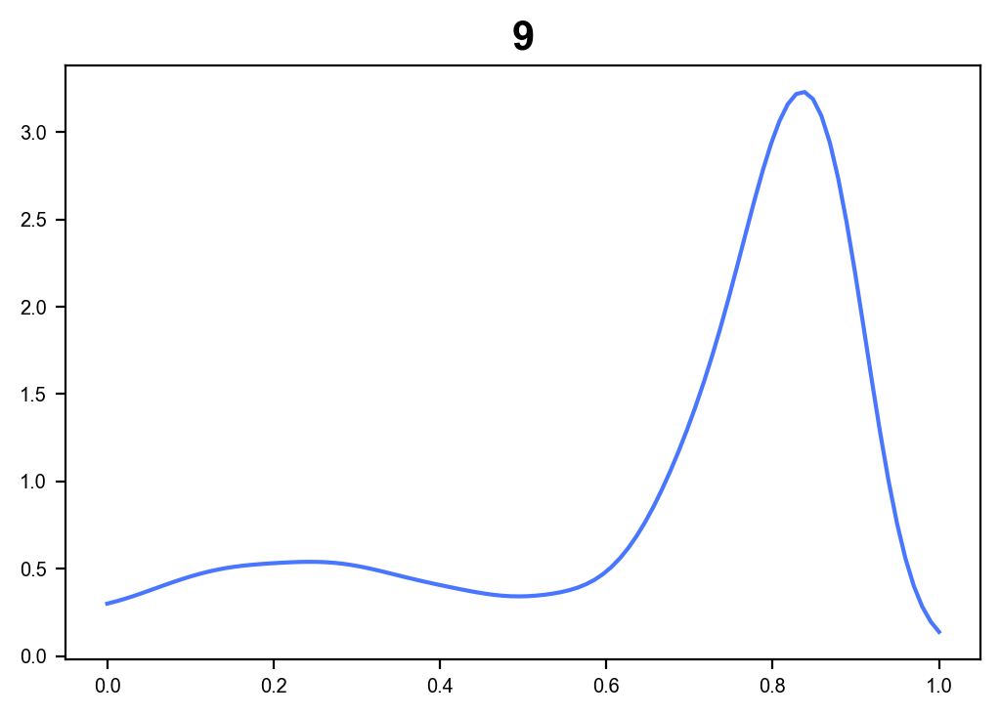

[2 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1
 2 2 1 2 2 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 1 2 2 2 1 2 2 1 1 2 2 2 2 2 2 2 1 2 2 2
 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 1 2 2 2
 2 1 2 2 2 1 2 2 2 1 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 1 1 2 1 2 2 2 1 2 2 2
 2 2 2 2 1 1 2 2 2 1 2 2 2 2 2 2 1 2 2 2 2 1 2 2 1 2 2 2 1 2 2 2 2 2 1 2 2
 2 2 2 2 2 2 2 2 1 2 2 2]


In [56]:
for i in range(len(cl_order)):
    cl_cat = categories[cl_order[i]]
    vec_corr = eigenvec[cl_cat]@eigenvec[cl_cat].T
    
    Z=linkage((1-vec_corr)[np.triu_indices(vec_corr.shape[0],k=1)],method='weighted')#method='weighted')
    dg=dendrogram(Z)
    #X_re= X[:,dg['leaves']]#X_re reorder X by clustering
    plt.show()
    
    vec_corr_re = vec_corr[dg['leaves'],:][:,dg['leaves']]
    plt.imshow(vec_corr_re, aspect='equal', cmap=plt.cm.coolwarm, interpolation='nearest')
    plt.title(i,fontsize=15,weight='bold')
    plt.colorbar()
    plt.show()

    xcos = np.linspace(0,1,100)
    plt.plot(xcos,gaussian_kde(vec_corr.flatten())(xcos))
    plt.title(i,fontsize=15,weight='bold')
    plt.show()
    
    T = fcluster(Z, t=0.9, criterion='distance')
    print(T)

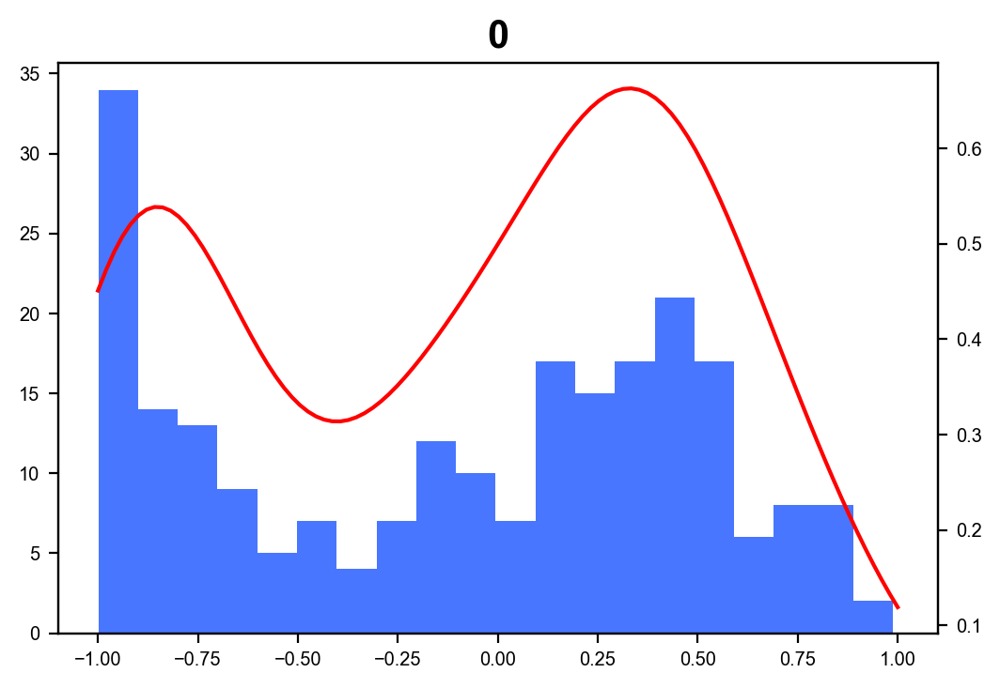

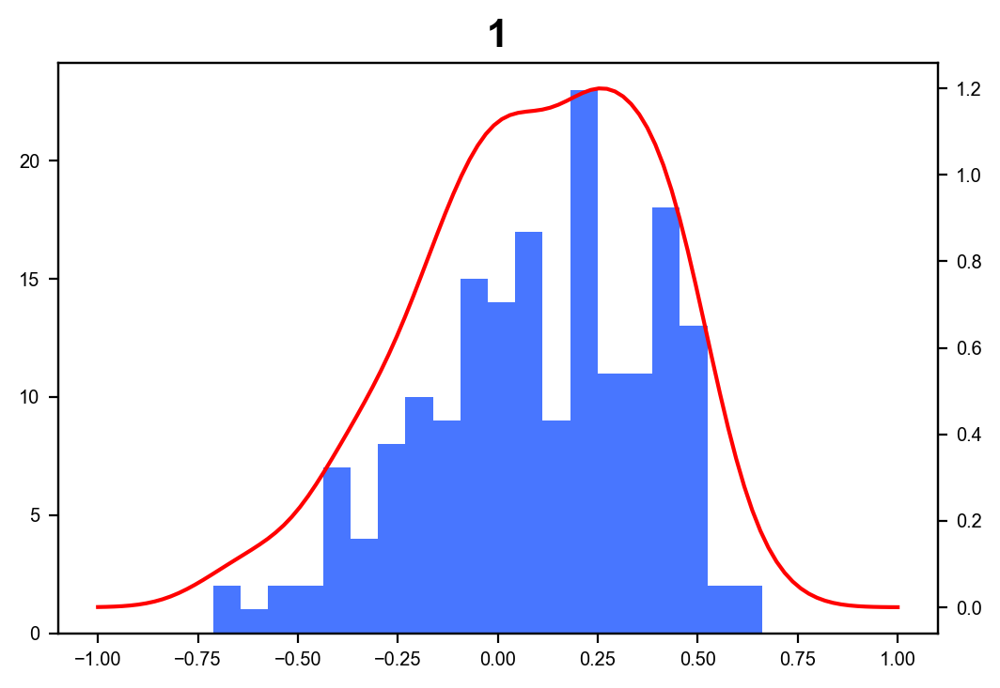

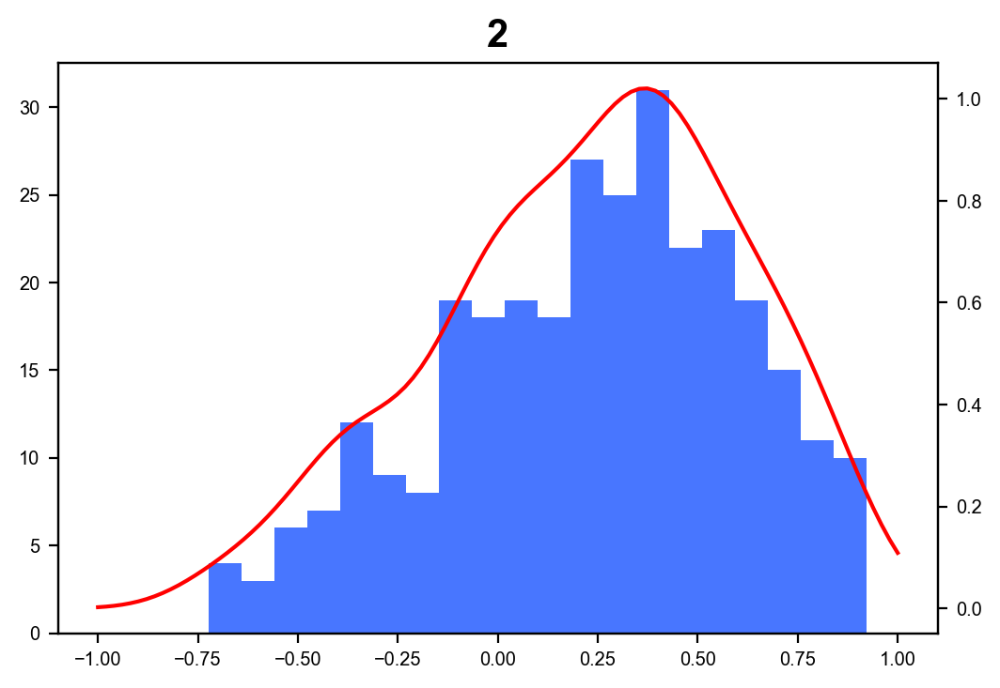

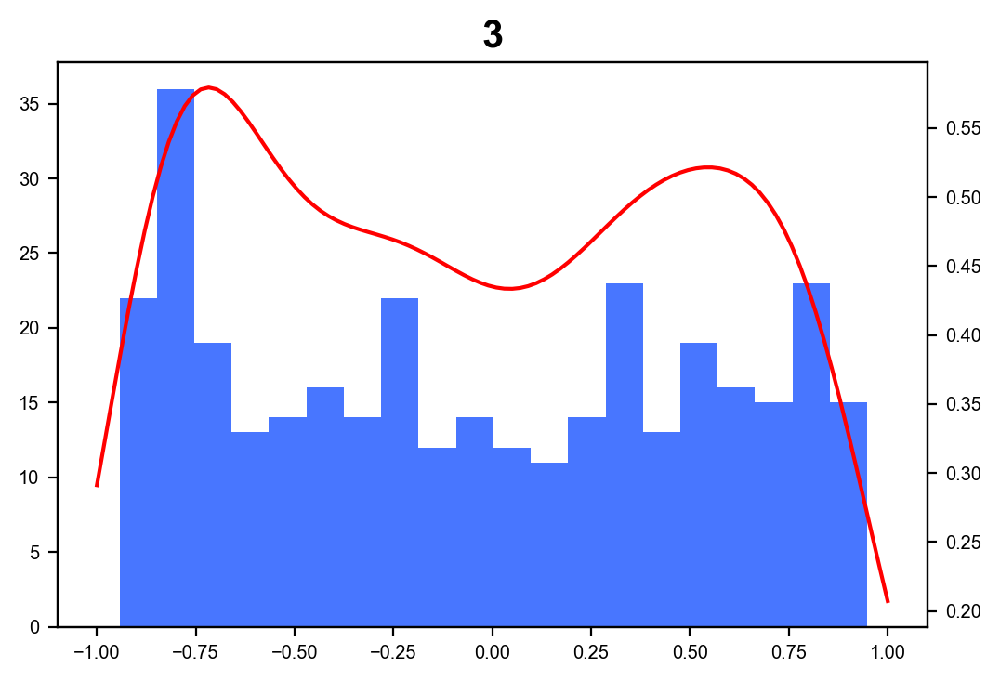

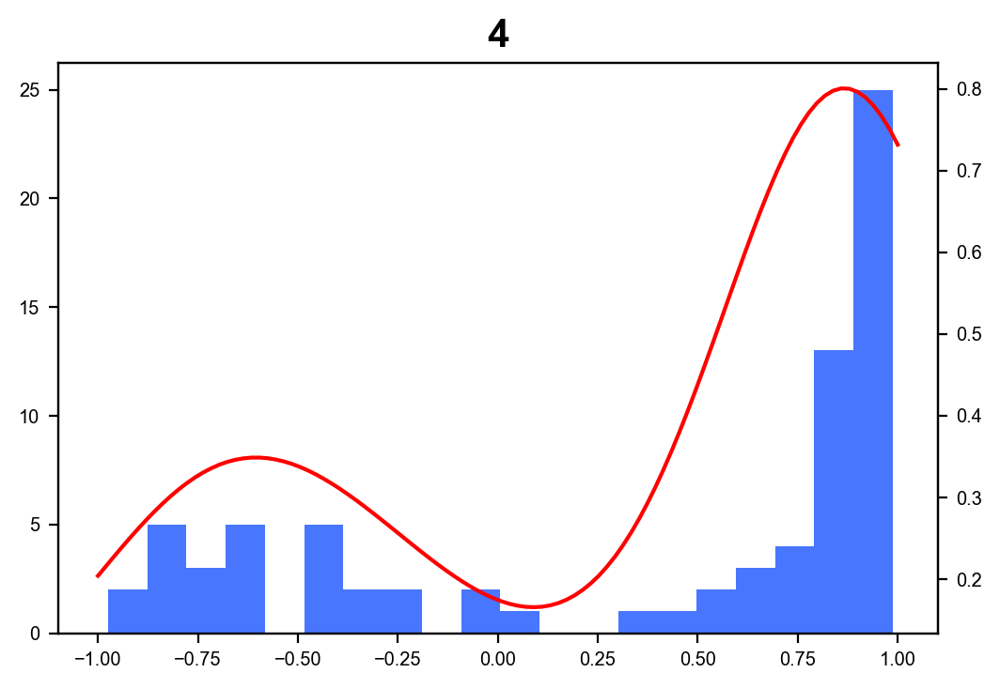

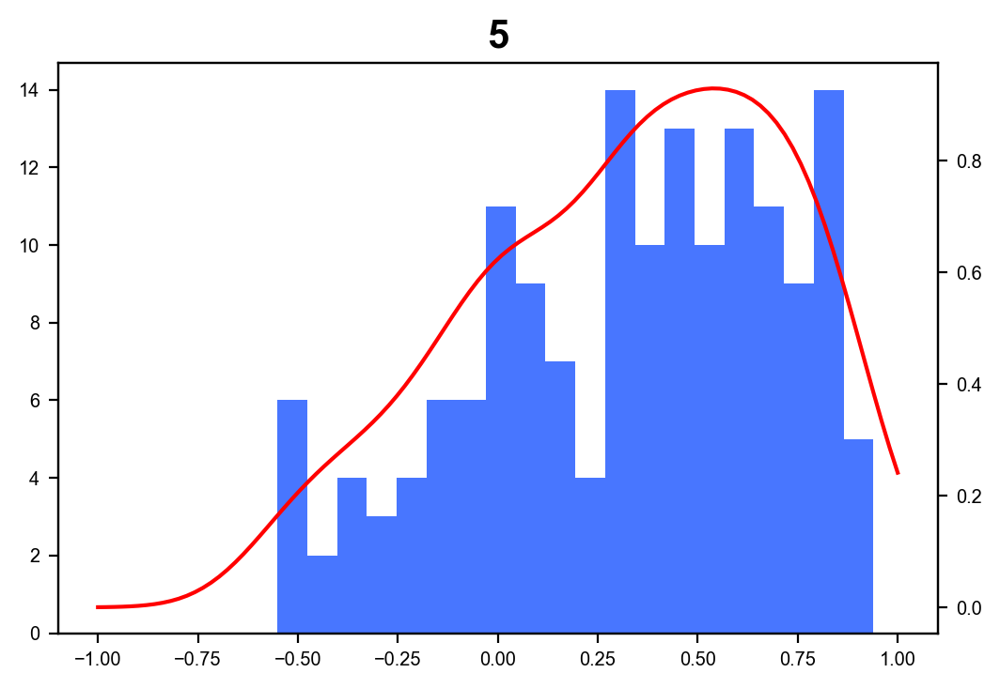

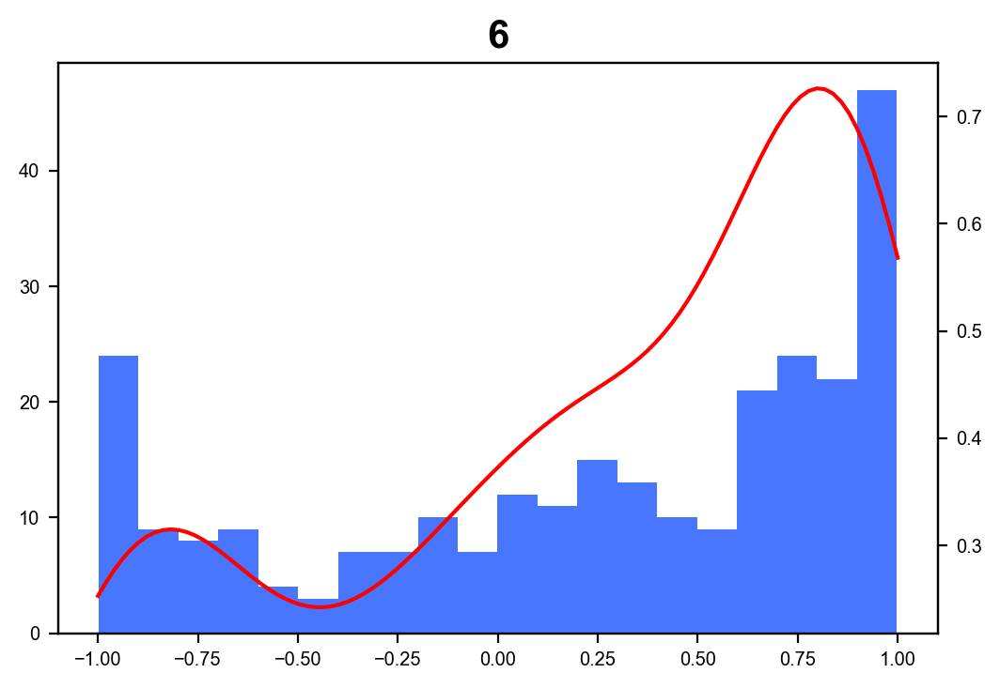

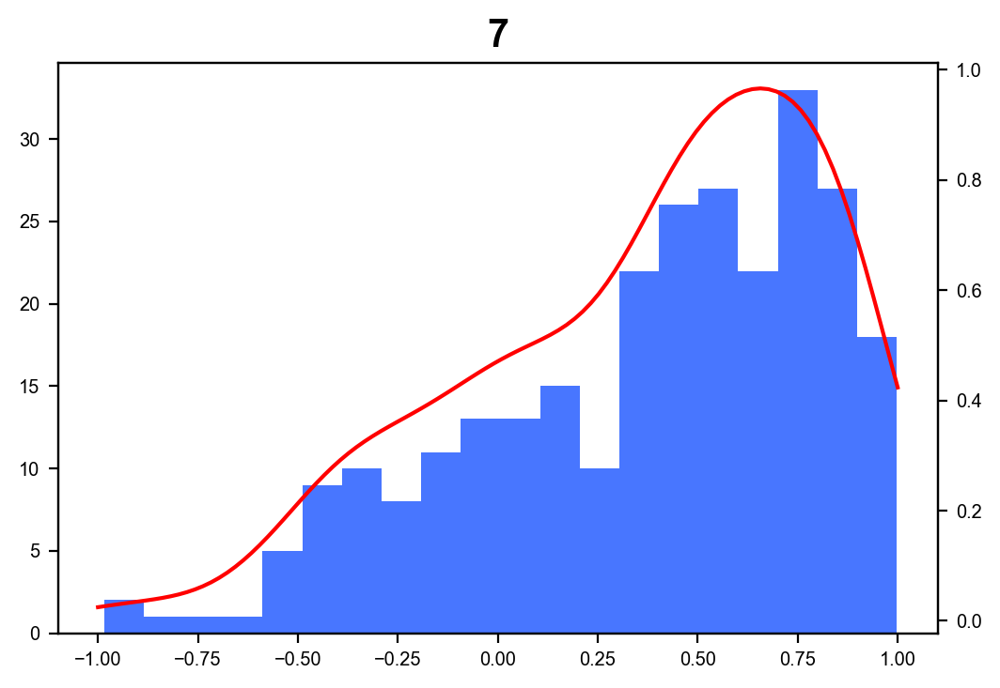

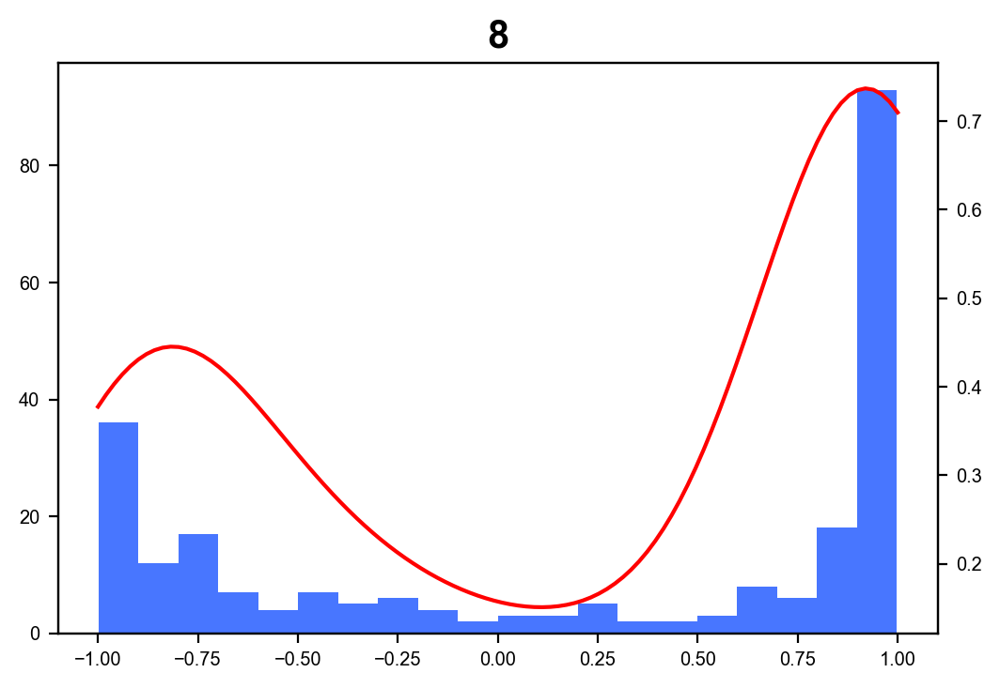

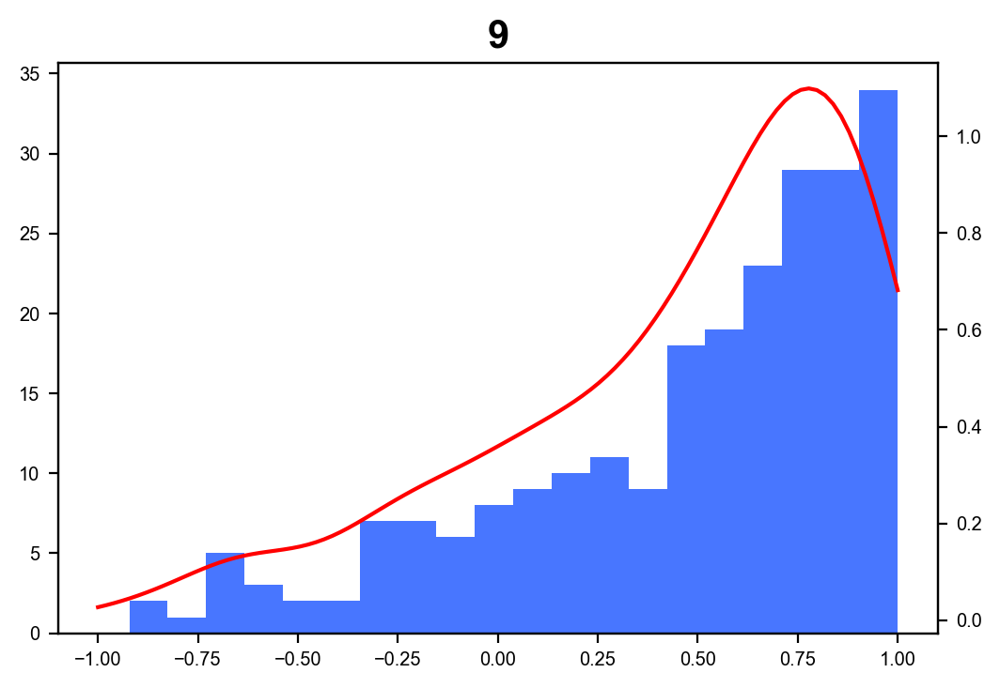

In [280]:
for i in range(len(cl_order)):
    cl_cat = categories[cl_order[i]]
    g_pc_cl = g_pc[clusters==cl_cat]
    vec_cl = eigenvec[cl_cat]
    velo_cl = velo_pca[clusters==cl_cat]
    
    vv_corr = np.zeros(vec_cl.shape[0])
    for j in range(vec_cl.shape[0]):
        vv_corr[j] = vec_cl[j]@g_pc_cl[j]@velo_cl[j]/np.sqrt((vec_cl[j]@g_pc_cl[j]@vec_cl[j])*(velo_cl[j]@g_pc_cl[j]@velo_cl[j]))
        
    plt.hist(vv_corr,bins=20)
    plt.twinx()
    xcos = np.linspace(-1,1,100)
    plt.plot(xcos,gaussian_kde(vv_corr)(xcos),c='r')
    plt.title(i,fontsize=15,weight='bold')
    plt.show()

In [308]:
cl_ind2 = (clusters==categories[cl_order[2]])
cl_ind8 = (clusters==categories[cl_order[3]])
cl_ind9 = (clusters==categories[cl_order[4]])
cl_ind89 = np.logical_or(cl_ind8,cl_ind9)
cl_ind89 = np.logical_or(cl_ind2,cl_ind89)
g_pc_cl89 = g_pc[cl_ind89]
eigenvec89 = np.zeros([g_pc_cl89.shape[0],X_pca.shape[1]])

for j in range(g_pc_cl89.shape[0]):
    eigenvec89[j] = np.linalg.eigh(g_pc_cl89[j])[1][:,-1]
#eigenvec89 = align(eigenvec89,20)

cl89 = clusters[cl_ind89]

for i in [2,3,4]:
    cl_ind = (cl89==categories[cl_order[i]])
    eigenvec89[cl_ind] = align(eigenvec89[cl_ind],20)

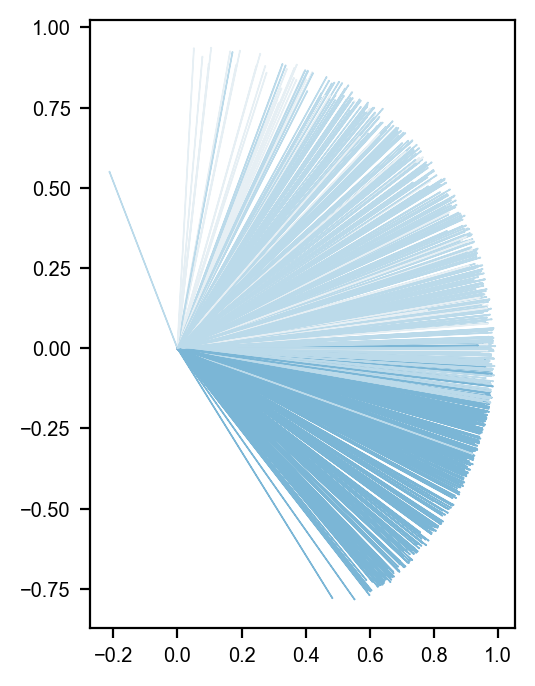

In [309]:
eigenvec89_0 = np.linalg.eigh(eigenvec89.T@eigenvec89)[1][:,-2:]
eigenvec89_1 = eigenvec89@eigenvec89_0

for j in range(eigenvec89_1.shape[0]):
    if cl89[j]==categories[cl_order[2]]:
        plt.arrow(0,0,eigenvec89_1[j,1],eigenvec89_1[j,0],color=cat_colors[2])
    elif cl89[j]==categories[cl_order[3]]:
        plt.arrow(0,0,eigenvec89_1[j,1],eigenvec89_1[j,0],color=cat_colors[3])
    elif cl89[j]==categories[cl_order[4]]:
        plt.arrow(0,0,eigenvec89_1[j,1],eigenvec89_1[j,0],color=cat_colors[4])

plt.gca().set_aspect('equal')
plt.show()

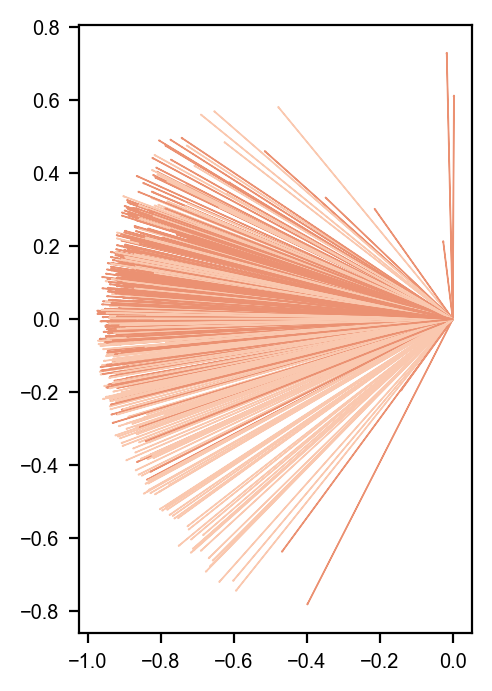

In [307]:
cl_ind89_0 = np.logical_or(cl89==categories[cl_order[6]],cl89==categories[cl_order[7]])

eigenvec89_0 = np.linalg.eigh(eigenvec89[cl_ind89_0].T@eigenvec89[cl_ind89_0])[1][:,-2:]
eigenvec89_1 = eigenvec89@eigenvec89_0

for j in range(eigenvec89_1.shape[0]):
    if cl89[j]==categories[cl_order[6]]:
        plt.arrow(0,0,eigenvec89_1[j,1],eigenvec89_1[j,0],color=cat_colors[6])
    elif cl89[j]==categories[cl_order[7]]:
        plt.arrow(0,0,eigenvec89_1[j,1],eigenvec89_1[j,0],color=cat_colors[7])

plt.gca().set_aspect('equal')
plt.show()

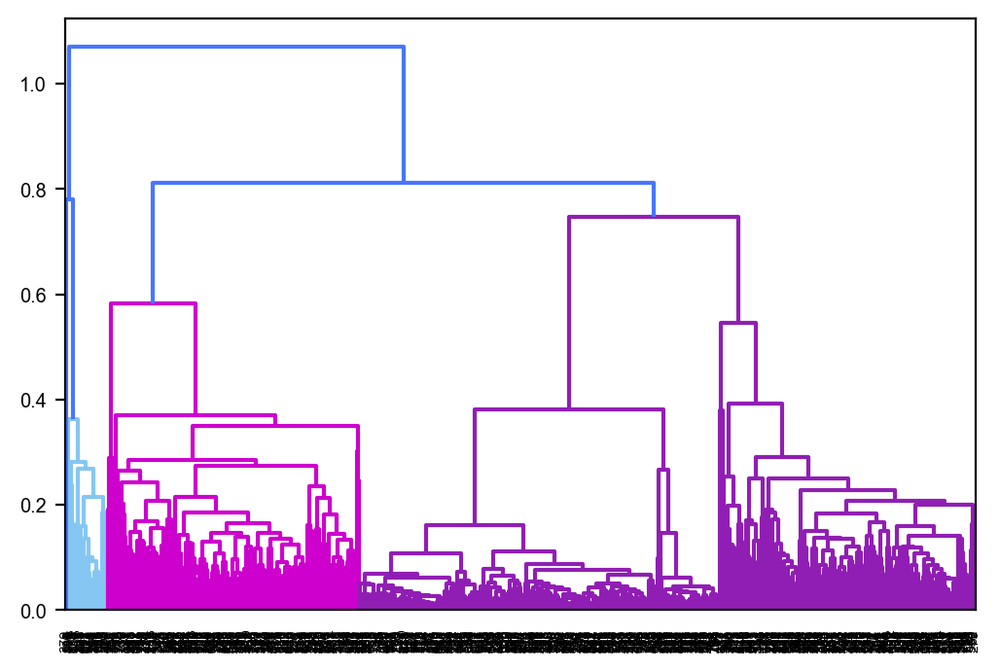

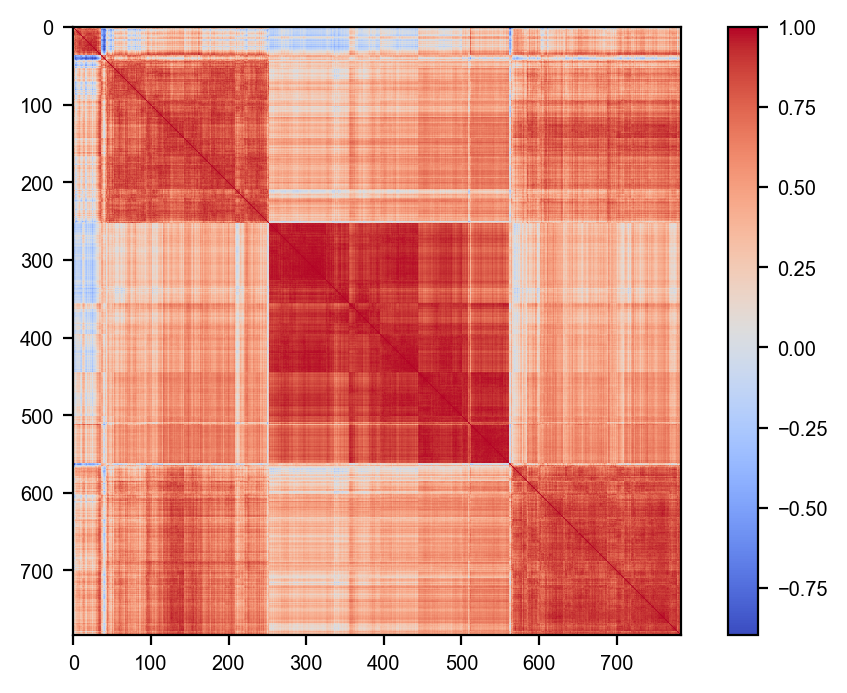

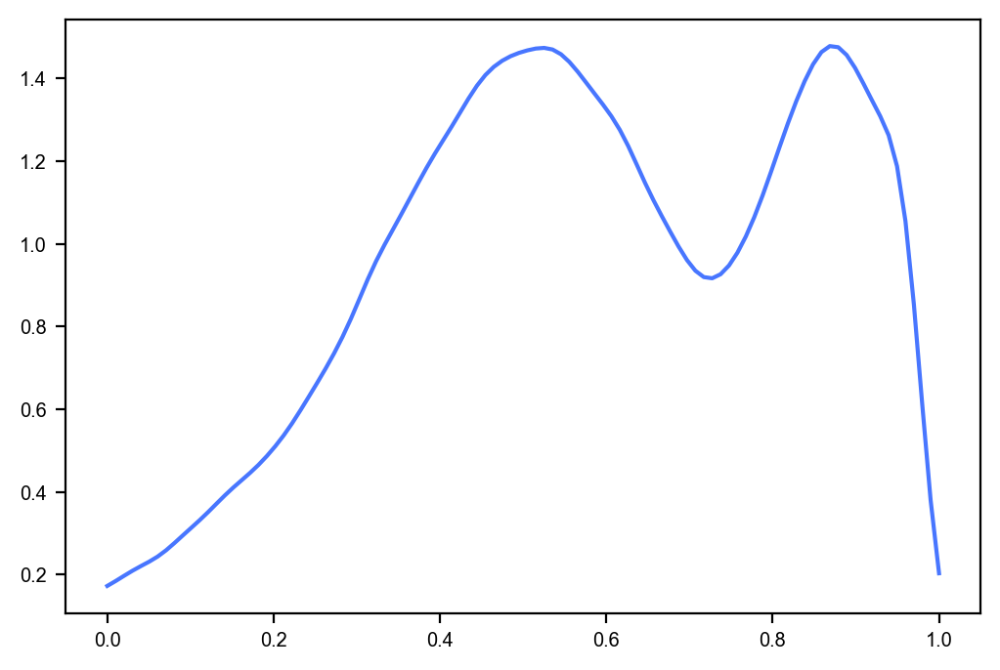

[2 2 2 2 2 1 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 1 1 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 1 2 2 2 2 2 2 2 

In [282]:
vec_corr = eigenvec89@eigenvec89.T

Z=linkage((1-vec_corr)[np.triu_indices(vec_corr.shape[0],k=1)],method='weighted')#method='weighted')
dg=dendrogram(Z)
#X_re= X[:,dg['leaves']]#X_re reorder X by clustering
plt.show()

vec_corr_re = vec_corr[dg['leaves'],:][:,dg['leaves']]
plt.imshow(vec_corr_re, aspect='equal', cmap=plt.cm.coolwarm, interpolation='nearest')
plt.colorbar()
plt.show()

xcos = np.linspace(0,1,100)
plt.plot(xcos,gaussian_kde(vec_corr.flatten())(xcos))
plt.show()

T = fcluster(Z, t=0.9, criterion='distance')
print(T)

In [285]:
cl89_order = np.zeros(cl89.shape[0])
for i in range(cl89.shape[0]):
    if cl89[i]==categories[cl_order[2]]:
        cl89_order[i] = 2
    elif cl89[i]==categories[cl_order[8]]:
        cl89_order[i] = 8
    elif cl89[i]==categories[cl_order[9]]:
        cl89_order[i] = 9
        
cl89_re = np.zeros(vec_corr.shape)
for i in range(vec_corr.shape[0]):
    for j in range(vec_corr.shape[1]):
        if cl89[dg['leaves'][i]]==cl89[dg['leaves'][j]]:
            cl89_re[i,j] = cl89_order[dg['leaves'][i]]

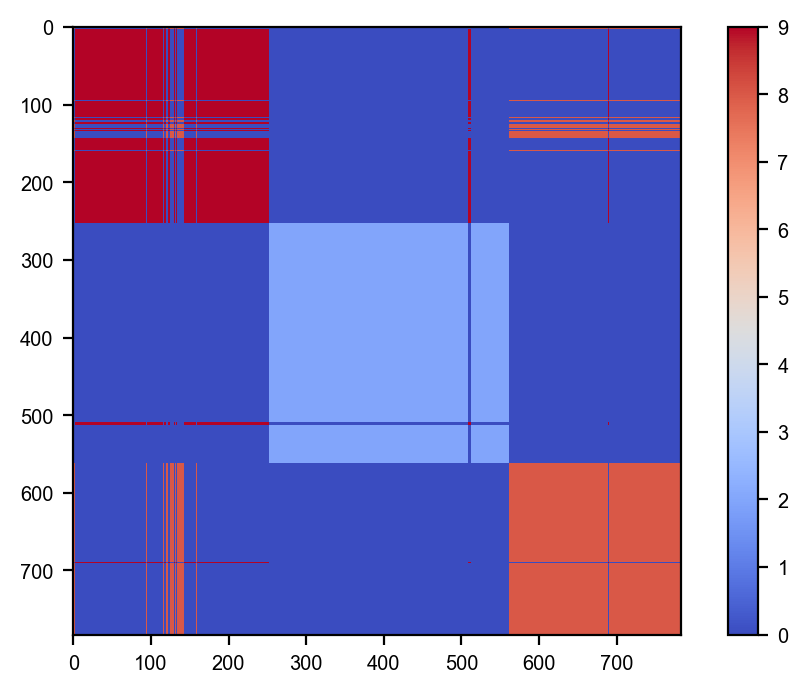

In [286]:
plt.imshow(cl89_re, aspect='equal', cmap=plt.cm.coolwarm, interpolation='nearest')
plt.colorbar()
plt.show()

In [72]:
def align0(vecs,n_step=10,beta=1):
    wij = vecs@vecs.T
    for i in range(vecs.shape[0]):
        wij[i,i] = 0
    mji = np.ones([vecs.shape[0],vecs.shape[0]])
    for i in range(vecs.shape[0]):
        mji[i,i] = 0
    #beta = 100
    loss = np.zeros(n_step)
    
    for k in range(n_step):
        for j in range(vecs.shape[0]):
            for i in range(vecs.shape[0]):
                if j==i:
                    mji[j,i] = 0
                else:
                    mji[j,i] = np.tanh(beta*(wij[j,:]@mji[:,j]-wij[j,i]*mji[i,j]))
        
        mi = np.zeros(vecs.shape[0])
        for i in range(vecs.shape[0]):
            mi[i] = np.tanh(beta*wij[i,:]@mji[:,i])
        si = np.array([np.sign(mi[i]) for i in range(vecs.shape[0])])
        
        loss[k] = si@wij@si

    plt.plot(np.arange(n_step),loss)
    
    vecs_a = np.array([si[i]*vecs[i] for i in range(vecs.shape[0])])
    return(vecs_a)

In [89]:
cl_ind0 = (clusters==0)
g_pc_cl0 = g_pc[cl_ind0]
eigenvec0 = np.zeros([g_pc_cl0.shape[0],X_pca.shape[1]])

for j in range(g_pc_cl.shape[0]):
    eigenvec0 = np.linalg.eigh(g_pc_cl0)[1][:,-1]

array([[-0.84832438,  0.02547405,  0.14856752, ...,  0.07176292,
         0.0211171 , -0.01127937],
       [-0.76727599, -0.24157767, -0.13169833, ...,  0.03852496,
         0.03775507, -0.03414684],
       [-0.74310296, -0.16841029,  0.21668286, ...,  0.03167555,
         0.00322703, -0.00864912],
       ...,
       [-0.6736261 , -0.21148112, -0.16626401, ...,  0.00692115,
        -0.00727548, -0.01078958],
       [-0.63377432,  0.04891853,  0.35637603, ...,  0.03531644,
         0.07204095,  0.004339  ],
       [-0.47444831, -0.08438644, -0.00302447, ..., -0.05314741,
         0.01722448,  0.01265742]])

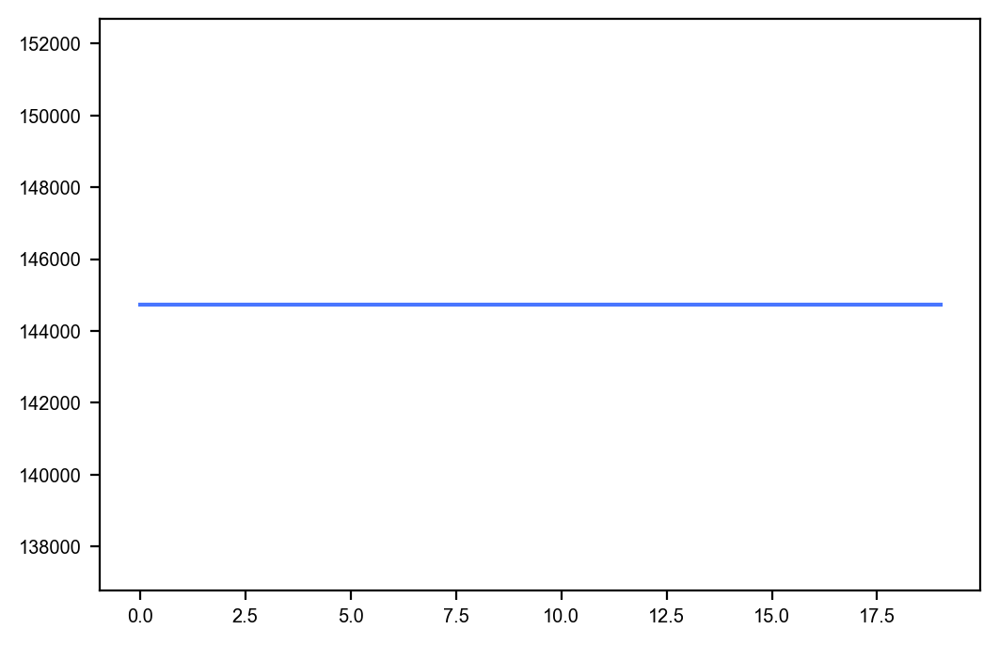

In [96]:
align0(eigenvec89,n_step=20,beta=1)

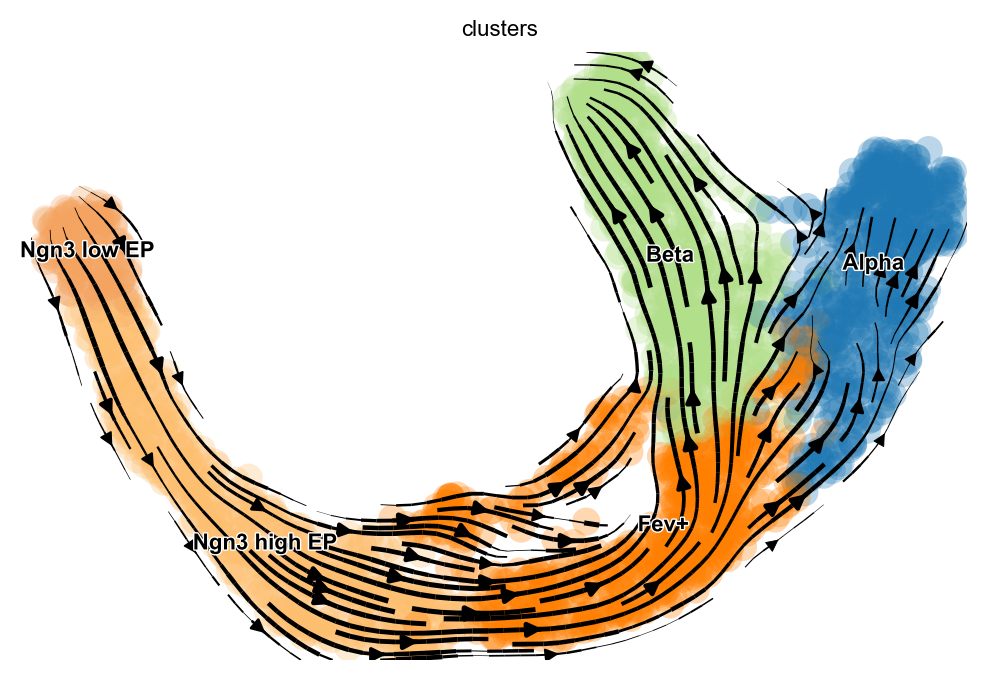

In [127]:
scv.pl.velocity_embedding_stream(adata,vkey='velocity',basis='umap')

        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph (using 1/16 cores)


  0%|          | 0/2322 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velo_pca_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velo_pca_umap', embedded velocity vectors (adata.obsm)


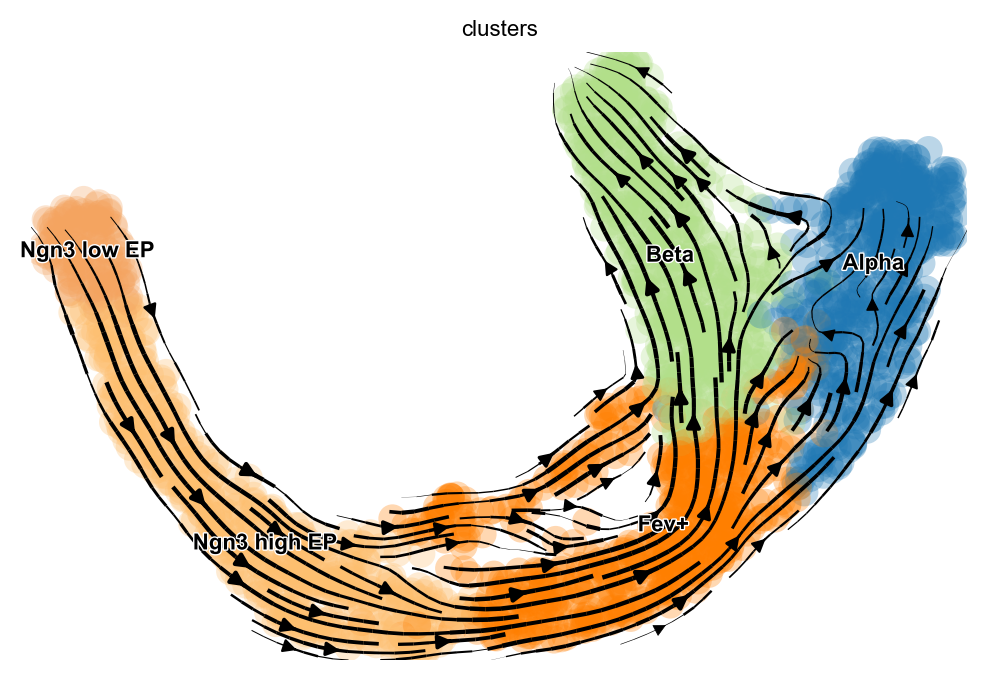

In [142]:
scv.tl.velocity_graph(adata,vkey='velo_pca',basis='umap')
scv.pl.velocity_embedding_stream(adata,vkey='velo_pca',basis='umap')

In [134]:
stiff_pca = np.zeros(X_pca.shape)

for i in categories:
    cl_ind = (clusters==i)
    stiff_pca[cl_ind] = eigenvec[i]

stiff_gene = stiff_pca@adata.varm['PCs'].T
adata.layers['stiff_gene'] = stiff_gene

In [139]:
adata.layers['velo_pca'] = velo_pca@adata.varm['PCs'].T

        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph (using 1/16 cores)


  0%|          | 0/2322 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'stiff_gene_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'stiff_gene_umap', embedded velocity vectors (adata.obsm)


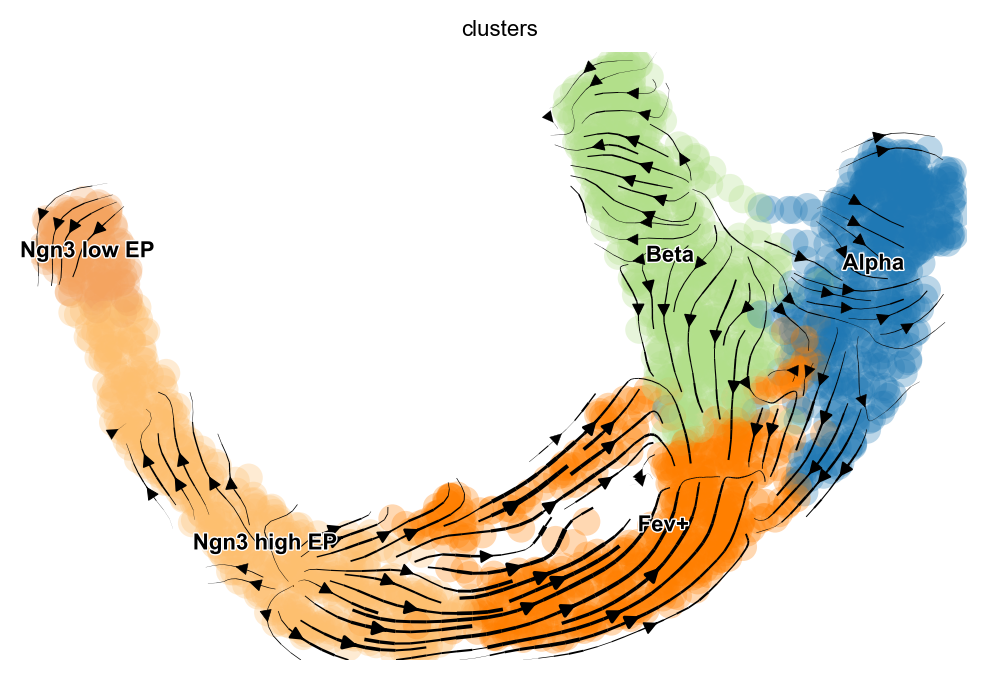

In [143]:
scv.tl.velocity_graph(adata,vkey='stiff_gene',basis='umap')
scv.pl.velocity_embedding_stream(adata,vkey='stiff_gene',basis='umap')